## Study 2: Time Reproduction Analysis

- **Notebook**: `SDTUStudy2.ipynb` | **Date**: 2025-06-04  
- **Contact**: chunyu.qu@tum.de | **Environment**: Python 3.12.7  

---

### 0. Initialization & Data Preparation  
Module import, path setup, batch CSV loading, data cleaning (unit conversion, outlier removal, trial-wise variable construction)

### 1. Quality Control  
Histograms, Q-Q plots, subject-level trial counts, coefficient of variation (CV) and SD distribution checks

### 2. Reproduction Bias  
Compute current bias (`curBias = rpr - curDur`), subject-level mean bias, CV and SD trends by duration

### 3. Central Tendency  
Examine systematic under/overestimation across different target durations

### 4. Serial Dependence  
Analyze whether current bias is affected by previous information`

### 5. Decisional Carryover Effect (DCI)  
Construct `preRpt`, plot bias variation under repetition × uncertainty conditions

### 6. n-back SDI  
Generate 2–10 back predictors, compute serial dependence index (SDI) slope across lags, compare between high vs. low uncertainty

### 7. Linear Mixed Models 5 most important part 
Fit LMMs: `curBias ~ TimeDur_prev * TransitionType + (1|subID)`, interpret fixed effects and subject-level variance

### 8. Deviation Index (DVI)  
Compute `DVI = rpr - subject_mean(curDur)`, plot DVI against `diffDur` (overall and sequences)

### 9. Other  psychometric Analysis

---


### 0.1 Environment preparation

In [236]:
# Import required libraries
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from io import StringIO
import pymc as pm
import arviz as az
import warnings
from scipy.optimize import curve_fit

In [237]:
data_folder = os.path.join('..', 'DATA')
%config InlineBackend.figure_format = 'retina'  



---

### Function Overview

This notebook processes RDK-based time reproduction data. It includes:

* Data loading & cleaning
* Robust outlier removal
* Trial-wise variable generation
* Repeated-measures ANOVA
* DVI curve plotting

---

### 0. Extract Prolific IDs

```python
extract_all_prolific_pids(folder)
```

Maps subject files to their `PROLIFIC_PID`.

---

### 1. Clean Raw Data

```python
basic_cleaning(folder)
```

* Skips headers
* Converts `keyDuration` to seconds
* Adds `ReproductionError` and `subID`

---

### 1.2 Trial Valid Ratio

```python
calculate_trial_ratio(df)
```

Reports how complete each subject’s data is.

---

### 2. Outlier Removal (CRITICAL)

### 2.1 Per Subject (basic)

```python
advanced_iqr_filtering(df)
```

### **2.2 Per TimeDur (⭐ finally used)**

```python
clean_extremes_grouped_by_duration(df, error_thresh=0.49)
```

This function removes outliers **within each `TimeDur` condition** using:

* IQR-based filtering (25–75% interquartile range)
* An absolute error threshold of **±0.49 seconds**

> $$
> \text{Outlier if: } \left| \text{keyDuration} - \text{TimeDur} \right| > 0.49 \quad \text{or outside IQR}
> $$


####  Threshold 0.49 seconds

The threshold of **0.49s** is a pragmatic middle ground between:

* **0.6s**, which corresponds to **half of the full dynamic range** (from 0.8s to 2.0s; range = 1.2s → 1.2 / 2 = 0.6s), and
* **0.4s**, a **more conservative** threshold commonly used in stricter filtering pipelines to aggressively exclude outliers.

I chose **0.49s** as a balanced compromise:


---

#### How was 0.49s derived?

The value **0.49s = 490ms** was computed as:

$$
\boxed{0.49 = 0.4 + \frac{(0.06 +0.12)}{2}} \quad \text{where} \quad 0.06s = 30ms*2 ,0.12s=60ms*2
$$


---

####  Coherence-Dependent Signal Structure

<img src="design.png" width="600">

This diagram illustrates the stimulus envelope:

* **Ramps are shorter** (30ms) for **higher coherence** (70%)
* **Ramps are longer** (60ms) for **lower coherence** (30%)

### 2.3 Duration-Wise IQR + Relative Error Filter



Similar to 2.2, but instead of absolute error, it uses relative error


---

### 3–4. Plots

```python
plot_histograms(df)  
plot_qqplots(df)
```

---

### 5. Trial-Level Variables

```python
construct_trial_variables(df)
```

Adds n-back duration/coherence & transition types (LH, HL...).

---

### 6. Repeated-Measures ANOVA

```python
rmANOVA_gg_Long(data, dv, within, subject)
```

Applies GG correction if needed.

---

### 7. Plot DVI Curve

```python
plot_dvi_curve(df, by_transition=True)
```

Shows how previous durations bias current reproduction.

---

In [238]:
# Function 0: extract prolific IDs
def extract_all_prolific_pids(data_folder):
    pid_dict = {}
    for file_path in glob.glob(os.path.join(data_folder, '*.csv')):
        sub_id = os.path.basename(file_path).split('_')[0]
        try:
            df = pd.read_csv(file_path)
            if 'PROLIFIC_PID' in df.columns:
                pid = df['PROLIFIC_PID'].iloc[0]
                pid_dict[sub_id] = pid
            else:
                pid_dict[sub_id] = 'NOT FOUND'
        except Exception as e:
            pid_dict[sub_id] = f'ERROR: {e}'
    return pid_dict
    Usage
    prolific_ids = extract_all_prolific_pids("D:/SDMT/DataAna/PilotData")
    prolific_ids = extract_all_prolific_pids("D:/SDMT/DataAna/PilotData")
    df_summary['PROLIFIC_PID'] = df_summary['subID'].map(prolific_ids)

# Function 1 Read and clean all raw CSVs
def basic_cleaning(data_folder):
    all_dfs = []
    files = glob.glob(os.path.join(data_folder, '*.csv'))
    print(f" Found {len(files)} CSV files in {data_folder}\n")

    for file_path in files:
        try:
            # Try reading file with UTF-8, fallback to UTF-8-SIG
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    lines = f.readlines()
            except UnicodeDecodeError:
                with open(file_path, 'r', encoding='utf-8-sig') as f:
                    lines = f.readlines()
            # Skip 2 header lines after first
            if len(lines) < 4:
                print(f" File too short to process: {file_path}")
                continue
            cleaned_lines = [lines[0]] + lines[33:]
            df = pd.read_csv(StringIO(''.join(cleaned_lines)))
            # Check required columns
            if 'keyDuration' not in df.columns or 'TimeDur' not in df.columns:
                print(f"❌ Missing key columns in {file_path}, skipping.")
                continue
            df['keyDuration'] = df['keyDuration'] / 1000.0
            df['ReproductionError'] = df['keyDuration'] - df['TimeDur']
            # Extract subject ID from file name
            sub_id = os.path.basename(file_path).split('_')[0]
            df['subID'] = sub_id
            all_dfs.append(df)
        except Exception as e:
            print(f"❌ Failed to process {file_path}: {e}")
    if not all_dfs:
        print("🚫 No valid data files processed.")
        return pd.DataFrame()
    combined_df = pd.concat(all_dfs, ignore_index=True)
    print(f"\n✅ Successfully processed {len(all_dfs)} files.")
    print(f"👥 Unique subjects found: {combined_df['subID'].nunique()}")
    return combined_df
# Function 1.2: Calculate trial ratio
def calculate_trial_ratio(df, full_trial_count=240):
    summary = df.groupby('subID').size().reset_index(name='trial_count')
    summary['trial_ratio'] = summary['trial_count'] / full_trial_count
    return summary

# Function 2.1  Advanced outlier removal per subject (IQR + error limit)
def advanced_iqr_filtering(df_all, error_thresh=0.6):
    filtered_dfs = []
    for sub_id, df_sub in df_all.groupby("subID"):
        q1 = df_sub['keyDuration'].quantile(0.25)
        q3 = df_sub['keyDuration'].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        df_clean = df_sub[
            (df_sub['TimeDur'] >= 0.8) & (df_sub['TimeDur'] <= 1.6) &
            (df_sub['keyDuration'] >= lower_bound) & (df_sub['keyDuration'] <= upper_bound) &
            (df_sub['ReproductionError'].abs() <= error_thresh)
        ].copy()
        filtered_dfs.append(df_clean)
    return pd.concat(filtered_dfs, ignore_index=True)

# Function 2.2: group by TimeDur and remove extreme values based on IQR and error
def clean_extremes_grouped_by_duration(df_all, error_thresh=0.49, time_bounds=(0.8, 1.6), verbose=True):
    """
    for each TimeDur, remove extreme values based on IQR and error
    """
    df_all = df_all.copy()
    df_all["keep"] = True  # add a new column to track which trials to keep
    for dur, df_group in df_all.groupby("TimeDur"):
        if not (time_bounds[0] <= dur <= time_bounds[1]):
            df_all.loc[df_all["TimeDur"] == dur, "keep"] = False
            continue
        q1 = df_group["keyDuration"].quantile(0.25)
        q3 = df_group["keyDuration"].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        mask = (df_group["keyDuration"] < lower) | (df_group["keyDuration"] > upper) | \
               (df_group["ReproductionError"].abs() > error_thresh)

        df_all.loc[df_group[mask].index, "keep"] = False
    df_cleaned = df_all[df_all["keep"]].drop(columns=["keep"])
    if verbose:
        print(f"Removed {len(df_all) - len(df_cleaned)} trials out of {len(df_all)}")

    return df_cleaned

# Function 2.3: group by TimeDur and remove ouliers based on IQR and relative error
def clean_extremes_with_relative_error(df_all, error_thresh_relative=0.6, time_bounds=(0.8, 1.6), verbose=True):
    """
    For each TimeDur, remove extreme values based on IQR and relative error threshold (e.g., ±40%).

    Parameters:
        df_all (pd.DataFrame): The full trial dataset with columns 'TimeDur', 'keyDuration'
        error_thresh_relative (float): The max allowed relative error (e.g., 0.4 = ±40%)
        time_bounds (tuple): Allowed TimeDur values (e.g., 0.8 to 1.6)
        verbose (bool): Whether to print summary info

    Returns:
        pd.DataFrame: Cleaned trial dataframe
    """
    
    df_all = df_all.copy()
    df_all["keep"] = True  # Track which trials to keep
    for dur, df_group in df_all.groupby("TimeDur"):
        if not (time_bounds[0] <= dur <= time_bounds[1]):
            df_all.loc[df_group.index, "keep"] = False
            continue
        # IQR-based outlier detection (on keyDuration)
        q1 = df_group["keyDuration"].quantile(0.25)
        q3 = df_group["keyDuration"].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        mask_iqr = (df_group["keyDuration"] < lower) | (df_group["keyDuration"] > upper)
        # Relative error: abs((keyDuration - TimeDur) / TimeDur) > threshold
        rel_error = (df_group["keyDuration"] - dur).abs() / dur
        mask_rel = rel_error > error_thresh_relative
        # Combine both masks
        final_mask = mask_iqr | mask_rel
        df_all.loc[df_group[final_mask].index, "keep"] = False
    df_cleaned = df_all[df_all["keep"]].drop(columns=["keep"])
    if verbose:
        print(f"Removed {len(df_all) - len(df_cleaned)} trials out of {len(df_all)}")
    return df_cleaned

#  Function 3 plotting histograms for each subject
def plot_histograms(df, column='keyDuration', groupby='subID', bins=30):
    subjects = df[groupby].unique()
    n_cols = 3
    n_rows = int(np.ceil(len(subjects) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    axes = axes.flatten()
    
    for i, sub in enumerate(subjects):
        sub_data = df[df[groupby] == sub][column]
        axes[i].hist(sub_data.dropna(), bins=bins, color='skyblue', edgecolor='black')
        axes[i].set_title(f'{column} Histogram - {sub}')
        axes[i].set_xlabel(column)
        axes[i].set_ylabel('Frequency')
    
    # Remove unused subplots
    for ax in axes[len(subjects):]:
        fig.delaxes(ax)
    
    plt.tight_layout()
    plt.show()

#  Function 4 plotting Q-Q plots for each subject
def plot_qqplots(df, column='keyDuration', groupby='subID'):
    subjects = df[groupby].unique()
    n_cols = 3
    n_rows = int(np.ceil(len(subjects) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    axes = axes.flatten()
    for i, sub in enumerate(subjects):
        sub_data = df[df[groupby] == sub][column].dropna()
        stats.probplot(sub_data, dist="norm", plot=axes[i])
        axes[i].set_title(f'Q-Q Plot - {sub}')
    for ax in axes[len(subjects):]:
        fig.delaxes(ax)
        plt.tight_layout()
    plt.show()
#  Function 5 build trial-level variables
def construct_trial_variables(df, max_n_back=10, verbose=True):
    """
    clean and construct trial-level variables

    paramiters:
        df (pd.DataFrame): TimeDur, keyDuration...
        max_n_back (int):  n-back variable
        verbose (bool): if True, print the progress

    return:
        df_cleaned (pd.DataFrame):DataFrame
    """
    df = df.copy()
    # rename columns
    df = df.rename(columns={
        'trials.thisN': 'trial_num',
        'TimeDur': 'curDur',
        'keyDuration': 'rpr',
        'ReproductionError': 'curBias',
        'Coherence1': 'curCoherence'
    })
    # add 1-back variables
    df['preDur1back'] = df.groupby('subID')['curDur'].shift(1)
    df['preCoherence1back'] = df.groupby('subID')['curCoherence'].shift(1)
    # build transition type
    def classify_transition(row):
        if pd.isnull(row['preCoherence1back']):
            return np.nan
        prev = 'High' if row['preCoherence1back'] == 0.3 else 'Low'
        curr = 'High' if row['curCoherence'] == 0.3 else 'Low'
        return prev[0] + curr[0]
    df['TransitionType'] = df.apply(classify_transition, axis=1)
    #  add n-back variables
    for n in range(2, max_n_back + 1):
        df[f'preDur{n}back'] = df.groupby('subID')['curDur'].shift(n)
        df[f'preCoherence{n}back'] = df.groupby('subID')['curCoherence'].shift(n)
    # remove rows with missing values in 1-back variables
    df = df.dropna(subset=['preDur1back', 'preCoherence1back']).copy()
    # keep columns
    keep_cols = ['subID', 'trial_num', 'curDur', 'rpr', 'curBias', 'curCoherence',
                 'preDur1back', 'preCoherence1back', 'TransitionType'] + \
                [f'preDur{n}back' for n in range(2, max_n_back + 1)] + \
                [f'preCoherence{n}back' for n in range(2, max_n_back + 1)]
    df_cleaned = df[[col for col in keep_cols if col in df.columns]].copy()
    return df_cleaned

# define function to do repeated measures ANOVA with Greenhouse-Geisser corrections
# provided long-format data
def rmANOVA_gg_Long(data, dv, within, subject):
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        if len(within) == 1:
            GGpass = pg.sphericity(data, dv=dv, subject=subject, within=within, method='greenhouse-geisser')[0]
            aov = pg.rm_anova(data=data, dv=dv, within=within, subject=subject, detailed=True, effsize="np2", correction= not GGpass)
            if not GGpass:
                aov['DF-GG-corr'] = aov['DF'] * aov['eps'][0]
                aov.drop(columns=['sphericity', 'W-spher', 'p-spher'], inplace=True)
                print('* The assumption of sphericity is violated for factor:', within)
            return aov
        elif len(within) == 2:
            GGpass = pd.Series([True,True,True])
            factorDict = {"0":within[0], "1":within[1], "2":within}
            for i in range(3):
                GGpass[i] = pg.sphericity(data, dv=dv, subject=subject, within=factorDict[str(i)], method='greenhouse-geisser')[0]
                if not GGpass[i]:
                    print('* The assumption of sphericity is violated for factor:', factorDict[str(i)])
            aov = pg.rm_anova(data=data, dv=dv, within=within, subject=subject, detailed=True, effsize="np2", correction=True)
            eps = pd.Series([1,1,1])
            GGcrr = [not x for x in GGpass]
            eps[GGcrr] = aov['eps'][GGcrr]
            aov['DF1-GGcrr'] = aov['ddof1'] * eps
            aov['DF2-GGcrr'] = aov['ddof2'] * eps
            return aov
        
#  Function 7 plot dvi curve
def plot_dvi_curve(df,
                   time_col='curDur',
                   rpr_col='rpr',
                   prev_col='preDur1back',
                   group_col='subID',
                   transition_col='TransitionType',
                   by_transition=False,
                   min_trials=3,
                   xlim=(-0.9, 0.9),
                   ylim=(-0.15, 0.15),
                   figsize=(12, 8),
                   title=None):
    """
    plot dvi curve
    """
    df = df.copy()
    df['TimeDur'] = df[time_col]
    df['rpr'] = df[rpr_col]
    df['preDur'] = df[prev_col]
    df['subID'] = df[group_col]
    if by_transition:
        df['TransitionType'] = df[transition_col]

    #  DVI accroding the time duration
    df['DVI'] = df['rpr'] - df.groupby(['subID', 'TimeDur'])['rpr'].transform('mean')
    df['diffDur'] = np.round(df['preDur'] - df['TimeDur'], 2)

    if by_transition:
        # multi-panel plot
        fig, axes = plt.subplots(2, 2, figsize=figsize, sharex=True, sharey=True)
        transition_order = ['LL', 'LH', 'HL', 'HH']
        colors = {'LL': 'black', 'LH': 'gray', 'HL': 'blue', 'HH': 'green'}

        for i, trans in enumerate(transition_order):
            row, col = divmod(i, 2)
            ax = axes[row, col]

            data_sub = df[df['TransitionType'] == trans]
            dvi_par = data_sub.groupby(['subID', 'diffDur'])['DVI'].mean().reset_index()
            dvi_group = dvi_par.groupby('diffDur').agg(
                count=('DVI', 'count'),
                mean_DVI=('DVI', 'mean'),
                sem_DVI=('DVI', 'sem')
            ).reset_index()
            dvi_group = dvi_group[dvi_group['count'] >= min_trials]

            ax.errorbar(
                x=dvi_group['diffDur'],
                y=dvi_group['mean_DVI'],
                yerr=dvi_group['sem_DVI'],
                color=colors[trans],
                capsize=4,
                label=trans
            )
            ax.axhline(0, color='black', linestyle='--')
            ax.set_title(f'Transition: {trans}')
            ax.set_xlim(*xlim)
            ax.set_ylim(*ylim)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            if col == 0:
                ax.set_ylabel('Deviation Index (DVI)')
            if row == 1:
                ax.set_xlabel('Δ Duration (prev - curr) [s]')

        plt.suptitle(title or 'Sequential Effect: DVI by Transition Type', fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    else:
        dvi_par = df.groupby(['subID', 'diffDur'])['DVI'].mean().reset_index()
        dvi_group = dvi_par.groupby('diffDur').agg(
            count=('DVI', 'count'),
            mean_DVI=('DVI', 'mean'),
            sem_DVI=('DVI', 'sem')
        ).reset_index()
        dvi_group = dvi_group[dvi_group['count'] >= min_trials]

        fig, ax = plt.subplots(figsize=(7, 5))
        ax.errorbar(
            x=dvi_group['diffDur'],
            y=dvi_group['mean_DVI'],
            yerr=dvi_group['sem_DVI'],
            fmt='o-', color='black', capsize=4,
            label='Mean ± SEM'
        )
        ax.axhline(0, linestyle='--', color='gray')
        ax.set_xlabel('Pre - Current Duration (s)')
        ax.set_ylabel('Deviation Index (DVI)')
        ax.set_title(title or 'Overall Sequential Effect (DVI)')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        plt.legend()
        plt.tight_layout()
        plt.show()



### 0.2 Loading the data

In [239]:
df_all = basic_cleaning(data_folder)
print("filter trial number:")
print(df_all['subID'].value_counts())

 Found 62 CSV files in ..\DATA


✅ Successfully processed 62 files.
👥 Unique subjects found: 62
filter trial number:
subID
781145    241
026578    240
803870    240
657789    240
671778    240
         ... 
457570    240
459907    240
513989    240
573583    240
txy       240
Name: count, Length: 62, dtype: int64


In [240]:
df_all.head()

,Scale_setup.started,Scale_setup.stopped,participant,session,sex,age,date,expName,psychopyVersion,OS,...,trials.thisTrialN,trials.thisN,trials.thisIndex,trials.ran,TimeDur,Coherence1,TrialType,ReproductionError,subID,exit_routine.started
0,NaN,NaN,26578,1,男,19.0,2025-06-04_18h34.52.909,Serial_Dependence_U,2023.2.3,Win32,...,0.0,30.0,9.0,1.0,1.6,0.7,Time,-0.317,026578,NaN
1,NaN,NaN,26578,1,男,19.0,2025-06-04_18h34.52.909,Serial_Dependence_U,2023.2.3,Win32,...,1.0,31.0,13.0,1.0,1.4,0.3,Time,0.483,026578,NaN
2,NaN,NaN,26578,1,男,19.0,2025-06-04_18h34.52.909,Serial_Dependence_U,2023.2.3,Win32,...,2.0,32.0,2.0,1.0,1.2,0.3,Time,0.669,026578,NaN
3,NaN,NaN,26578,1,男,19.0,2025-06-04_18h34.52.909,Serial_Dependence_U,2023.2.3,Win32,...,3.0,33.0,20.0,1.0,0.8,0.3,Time,0.738,026578,NaN
4,NaN,NaN,26578,1,男,19.0,2025-06-04_18h34.52.909,Serial_Dependence_U,2023.2.3,Win32,...,4.0,34.0,15.0,1.0,0.8,0.7,Time,0.845,026578,NaN


##  1. Qulity Control:Distribution & Individual Differences

In [241]:
#df=advanced_iqr_filtering(df_all)
#df=clean_extremes_with_relative_error(df_all)
df=clean_extremes_grouped_by_duration(df_all)


Removed 8439 trials out of 14881


In [242]:
df_summary = calculate_trial_ratio(df)
df_summary = df_summary.sort_values(by='trial_ratio', ascending=False).reset_index(drop=True)
print("\n Subject-wise trial ratios (sorted):\n")
for i, row in df_summary.iterrows():print(f"Subject {i+1}: Name = {row['subID']}  trial_ratio = {row['trial_ratio']:.3f}") # | PROLIFIC_PID = {row['PROLIFIC_PID']}




 Subject-wise trial ratios (sorted):

Subject 1: Name = 743968  trial_ratio = 0.983
Subject 2: Name = 919598  trial_ratio = 0.979
Subject 3: Name = 897347  trial_ratio = 0.954
Subject 4: Name = 820531  trial_ratio = 0.954
Subject 5: Name = 787955  trial_ratio = 0.946
Subject 6: Name = 785063  trial_ratio = 0.921
Subject 7: Name = 384894  trial_ratio = 0.883
Subject 8: Name = 730111  trial_ratio = 0.871
Subject 9: Name = 349889  trial_ratio = 0.863
Subject 10: Name = 828098  trial_ratio = 0.858
Subject 11: Name = 882052  trial_ratio = 0.850
Subject 12: Name = 109550  trial_ratio = 0.846
Subject 13: Name = 199724  trial_ratio = 0.829
Subject 14: Name = 328537  trial_ratio = 0.825
Subject 15: Name = 026578  trial_ratio = 0.800
Subject 16: Name = 312070  trial_ratio = 0.796
Subject 17: Name = 803870  trial_ratio = 0.796
Subject 18: Name = 241220  trial_ratio = 0.729
Subject 19: Name = 243787  trial_ratio = 0.721
Subject 20: Name = 580953  trial_ratio = 0.721
Subject 21: Name = 649241  tri

In [243]:
# set threshold for trial_ratio
threshold = 0.7
qs = df_summary[df_summary['trial_ratio'] > threshold]['subID'].tolist()
df = df[df['subID'].isin(qs)].copy()
print(f"Subjects with trial_ratio > {threshold}: {len(qs)} participants")
print("Subject IDs:", qs)
print(f"Total trials retained: {len(df)}")
df = construct_trial_variables(df)
df.head()

Subjects with trial_ratio > 0.7: 20 participants
Subject IDs: ['743968', '919598', '897347', '820531', '787955', '785063', '384894', '730111', '349889', '828098', '882052', '109550', '199724', '328537', '026578', '312070', '803870', '241220', '243787', '580953']
Total trials retained: 4110


,subID,trial_num,curDur,rpr,curBias,curCoherence,preDur1back,preCoherence1back,TransitionType,preDur2back,...,preDur10back,preCoherence2back,preCoherence3back,preCoherence4back,preCoherence5back,preCoherence6back,preCoherence7back,preCoherence8back,preCoherence9back,preCoherence10back
1,026578,31.0,1.4,1.883,0.483,0.3,1.6,0.7,LH,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,026578,35.0,1.4,1.553,0.153,0.3,1.4,0.3,HH,1.6,...,NaN,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,026578,36.0,1.4,1.347,-0.053,0.7,1.4,0.3,HL,1.4,...,NaN,0.3,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,026578,38.0,1.6,1.981,0.381,0.3,1.4,0.7,LH,1.4,...,NaN,0.3,0.3,0.7,NaN,NaN,NaN,NaN,NaN,NaN
9,026578,39.0,1.0,1.191,0.191,0.7,1.6,0.3,HL,1.4,...,NaN,0.7,0.3,0.3,0.7,NaN,NaN,NaN,NaN,NaN


### Because in Study we do not collect data from Prolific, we can start to check our data distribution.


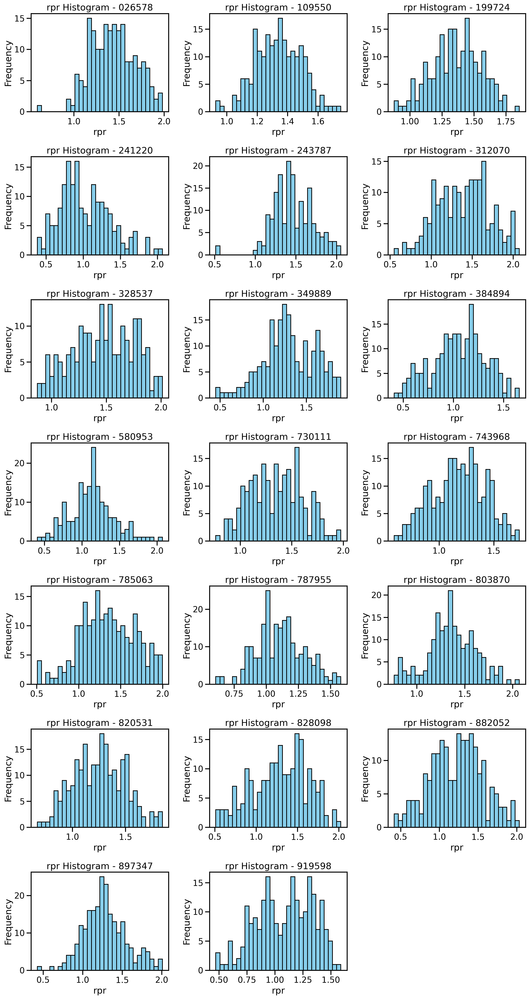

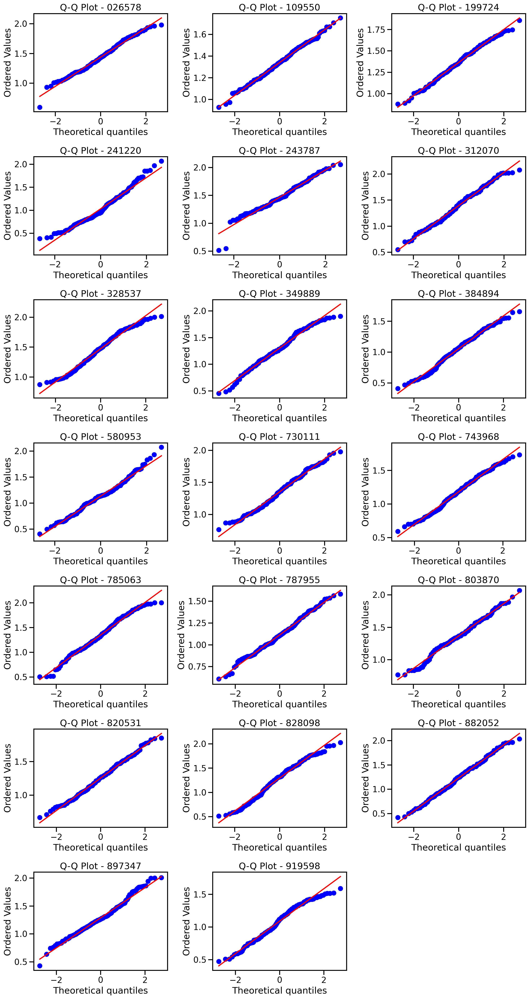

In [244]:
plot_histograms(df, column='rpr', groupby='subID')
plot_qqplots(df, column='rpr', groupby='subID')

### We need to check the transitiontypes of the data.

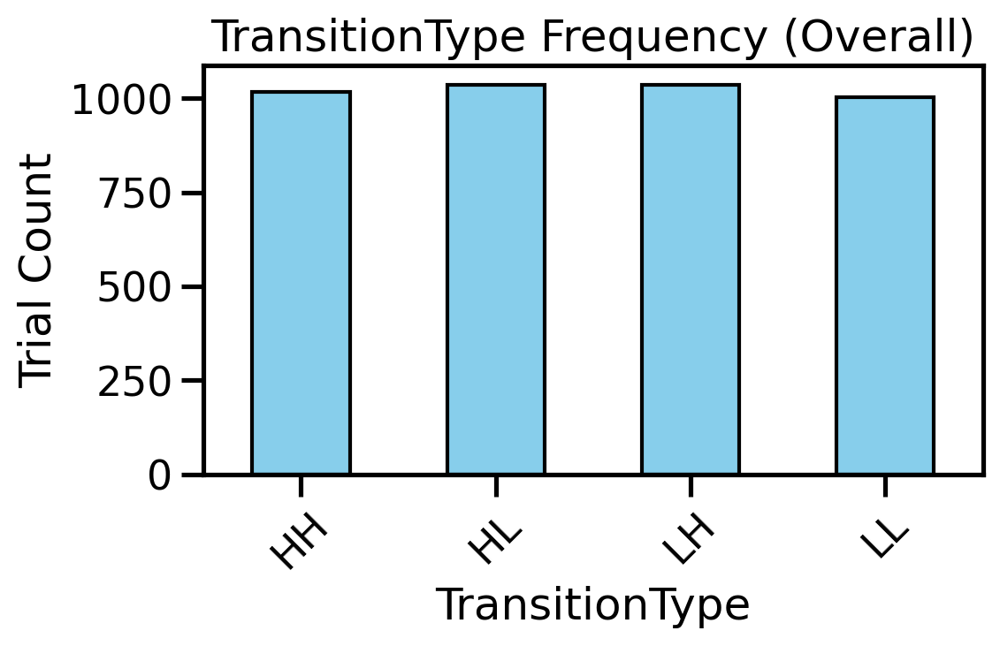

Overall TransitionType Proportions (%):
TransitionType
HH    24.89 %
HL    25.31 %
LH    25.31 %
LL     24.5 %
Name: proportion, dtype: object


In [245]:
# TransitionType
transition_counts = df["TransitionType"].value_counts().sort_index()

plt.figure(figsize=(6, 4))
transition_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("TransitionType Frequency (Overall)")
plt.xlabel("TransitionType")
plt.ylabel("Trial Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
transition_prop = df["TransitionType"].value_counts(normalize=True).sort_index()
print("Overall TransitionType Proportions (%):")
print((transition_prop * 100).round(2).astype(str) + " %")



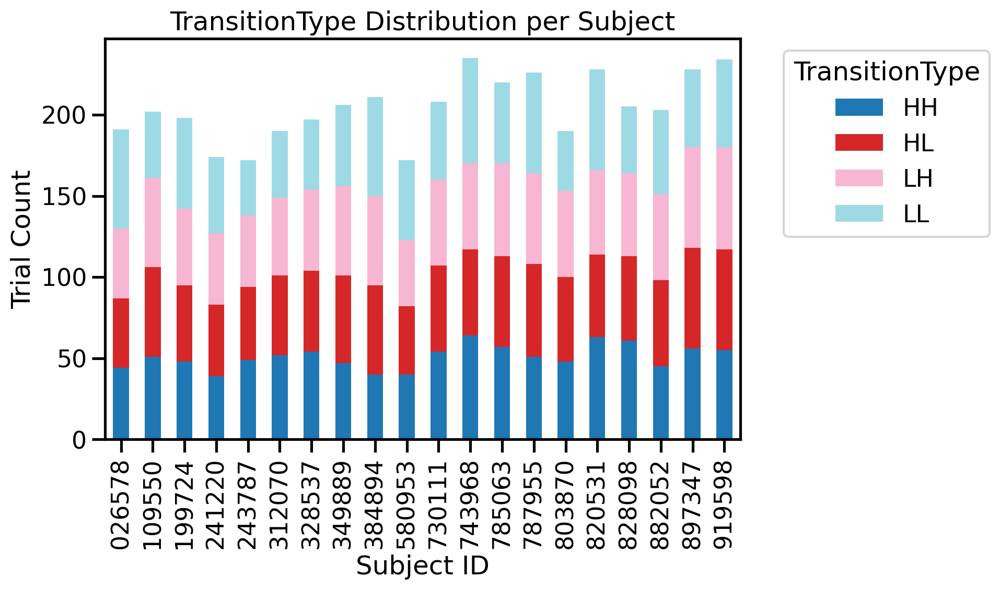

TransitionType proportions per subject (%):
TransitionType       HH       HL       LH       LL
subID                                             
026578          23.04 %  22.51 %  22.51 %  31.94 %
109550          25.25 %  27.23 %  27.23 %   20.3 %
199724          24.24 %  23.74 %  23.74 %  28.28 %
241220          22.41 %  25.29 %  25.29 %  27.01 %
243787          28.49 %  26.16 %  25.58 %  19.77 %
312070          27.37 %  25.79 %  25.26 %  21.58 %
328537          27.41 %  25.38 %  25.38 %  21.83 %
349889          22.82 %  26.21 %   26.7 %  24.27 %
384894          18.96 %  26.07 %  26.07 %  28.91 %
580953          23.26 %  24.42 %  23.84 %  28.49 %
730111          25.96 %  25.48 %  25.48 %  23.08 %
743968          27.23 %  22.55 %  22.55 %  27.66 %
785063          25.91 %  25.45 %  25.91 %  22.73 %
787955          22.57 %  25.22 %  24.78 %  27.43 %
803870          25.26 %  27.37 %  27.89 %  19.47 %
820531          27.63 %  22.37 %  22.81 %  27.19 %
828098          29.76 %  25.37 %  24.8

In [246]:
# subID × TransitionType 
transition_by_subject = df.pivot_table( index="subID", columns="TransitionType", aggfunc="size", fill_value=0)
transition_by_subject.plot( kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.title("TransitionType Distribution per Subject")
plt.xlabel("Subject ID")
plt.ylabel("Trial Count")
plt.xticks(rotation=90)
plt.legend(title="TransitionType", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
transition_by_subject_prop = transition_by_subject.div(transition_by_subject.sum(axis=1), axis=0)
print("TransitionType proportions per subject (%):")
print((transition_by_subject_prop * 100).round(2).astype(str) + " %")

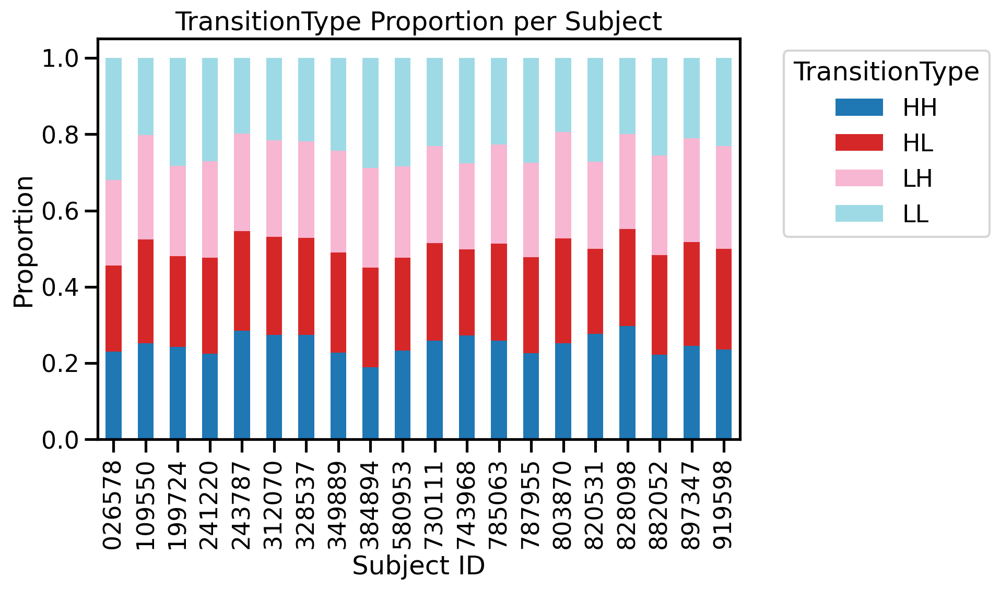

In [247]:
transition_prop = transition_by_subject.div(transition_by_subject.sum(axis=1), axis=0)
transition_prop.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.title("TransitionType Proportion per Subject")
plt.xlabel("Subject ID")
plt.ylabel("Proportion")
plt.xticks(rotation=90)
plt.legend(title="TransitionType", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### For the propose of controlling the 4 conditions, two functions are defined. The first one is to keep the same max trials, e.g. 40 trials. The second one is to keep the minimum trials among 4 conditions.

In [248]:
def balance_trials(df, condition_col="TransitionType", group_col="subID", max_per_cond=40):
    balanced = []

    for sub_id, df_sub in df.groupby(group_col):
        sub_balanced = []
        for cond, df_cond in df_sub.groupby(condition_col):
            n = min(len(df_cond), max_per_cond)
            sub_balanced.append(df_cond.sample(n=n, random_state=45))
        balanced.append(pd.concat(sub_balanced))

    return pd.concat(balanced).sort_values(by=[group_col, "trial_num"])
def balance_trials_min(df, condition_col="TransitionType", group_col="subID"):
    balanced = []

    for sub_id, df_sub in df.groupby(group_col):
        cond_counts = df_sub[condition_col].value_counts()
        min_count = cond_counts.min()

        sub_balanced = []
        for cond, df_cond in df_sub.groupby(condition_col):
            sub_balanced.append(df_cond.sample(n=min_count, random_state=45))
        balanced.append(pd.concat(sub_balanced))

    return pd.concat(balanced).sort_values(by=[group_col, "trial_num"])

### In this part, we choose to use the second way to control the trials. See the figure below.

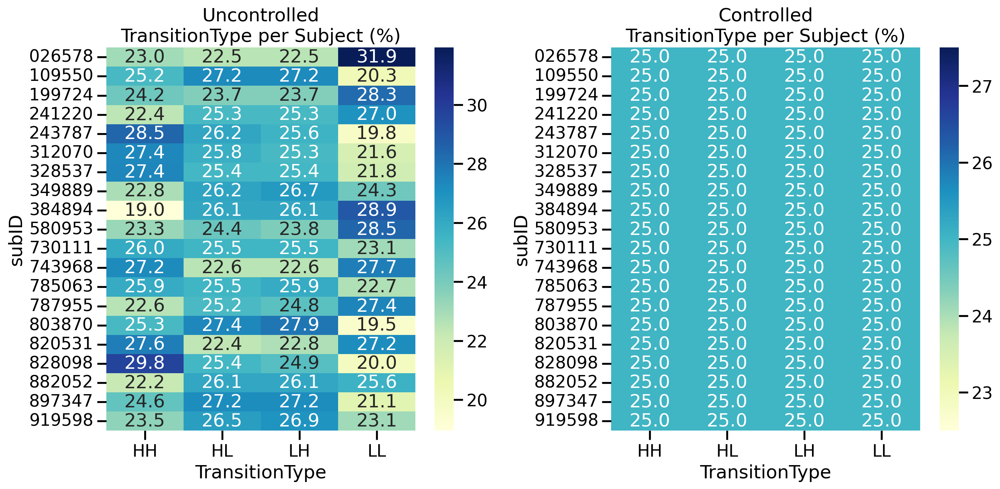

In [249]:
#dfb= balance_trials(df, max_per_cond=45)  
# dfb means df balanced which takes the minimum trials of the 4 transition types
dfb= balance_trials_min(df)
# subID × TransitionType 
transition_by_subject_controlled = dfb.pivot_table(index="subID", columns="TransitionType", aggfunc="size", fill_value=0)
# proportion_table unctrolled and controlled
ptuc = transition_by_subject.div(transition_by_subject.sum(axis=1), axis=0) * 100
ptc = transition_by_subject_controlled.div(transition_by_subject_controlled.sum(axis=1), axis=0) * 100
fig, axes = plt.subplots(1, 2, figsize=(14, 7))  
sns.heatmap(ptuc, annot=True, fmt=".1f", cmap="YlGnBu", ax=axes[0])
axes[0].set_title("Uncontrolled\nTransitionType per Subject (%)")
sns.heatmap(ptc, annot=True, fmt=".1f", cmap="YlGnBu", ax=axes[1])
axes[1].set_title("Controlled\nTransitionType per Subject (%)")
plt.tight_layout()
plt.show()

## 2  reproduction bias

In [250]:
df = dfb
# reproduction bias for each subject
genRprBias = df.groupby('subID')['curBias'].mean().reset_index()
print(genRprBias)
# Generallized Reproduction Bias
print('mean rpr Bias:', genRprBias['curBias'].mean().round(3))
print('SE of rpr Bias:', genRprBias['curBias'].sem().round(3))

     subID   curBias
0   026578  0.171517
1   109550  0.102500
2   199724  0.100947
3   241220 -0.126923
4   243787  0.199007
5   312070  0.161811
6   328537  0.250006
7   349889  0.104441
8   384894 -0.123700
9   580953 -0.030219
10  730111  0.118307
11  743968 -0.015580
12  785063  0.160575
13  787955 -0.072480
14  803870  0.133291
15  820531  0.065363
16  828098  0.075854
17  882052  0.024678
18  897347  0.081995
19  919598 -0.111741
mean rpr Bias: 0.063
SE of rpr Bias: 0.025


In [251]:
# 1 reproduction CV（Coefficient of Variation）
RprCV = df.groupby('subID').agg({'rpr': ['count', 'mean', 'std']}).reset_index()
RprCV.columns = ['subID', 'count', 'mean', 'std']
RprCV['cv'] = RprCV['std'] / RprCV['mean']
print(RprCV)
# overall CV
print('mean of overall CV:', RprCV['cv'].mean().round(3))
print('SE of overall CV:', RprCV['cv'].sem().round(3))
# t-test
import pingouin as pg
print(pg.ttest(RprCV['cv'], 0).round(3))

     subID  count      mean       std        cv
0   026578    172  1.445936  0.244367  0.169002
1   109550    164  1.346402  0.144402  0.107250
2   199724    188  1.363713  0.192387  0.141076
3   241220    156  1.024359  0.340815  0.332710
4   243787    136  1.463713  0.237653  0.162363
5   312070    164  1.405713  0.313018  0.222676
6   328537    172  1.481401  0.276873  0.186899
7   349889    188  1.292739  0.310739  0.240372
8   384894    160  1.043800  0.272731  0.261287
9   580953    160  1.131031  0.295482  0.261250
10  730111    192  1.344349  0.256806  0.191026
11  743968    212  1.176873  0.239853  0.203805
12  785063    200  1.350575  0.334954  0.248008
13  787955    204  1.103990  0.186066  0.168540
14  803870    148  1.360318  0.258215  0.189820
15  820531    204  1.262422  0.244032  0.193305
16  828098    164  1.288049  0.334506  0.259699
17  882052    180  1.200233  0.339718  0.283043
18  897347    192  1.281995  0.262734  0.204942
19  919598    216  1.083630  0.247660  0

In [252]:

mCVPar = df.groupby(['subID', 'curDur']).agg({'rpr': ['count', 'mean', 'std']}).reset_index()
mCVPar.columns = ['subID', 'curDur', 'count', 'mean', 'std']
mCVPar['cv'] = mCVPar['std'] / mCVPar['mean']


mCVAll = mCVPar.groupby('curDur').agg({'cv': ['count', 'mean', 'sem']
}).reset_index()
mCVAll.columns = ['curDur', 'count', 'mCV', 'seCV']

print(mCVAll)

   curDur  count       mCV      seCV
0     0.8     20  0.171109  0.015246
1     1.0     20  0.157182  0.011424
2     1.2     20  0.139088  0.008234
3     1.4     20  0.134312  0.008361
4     1.6     20  0.126758  0.006161


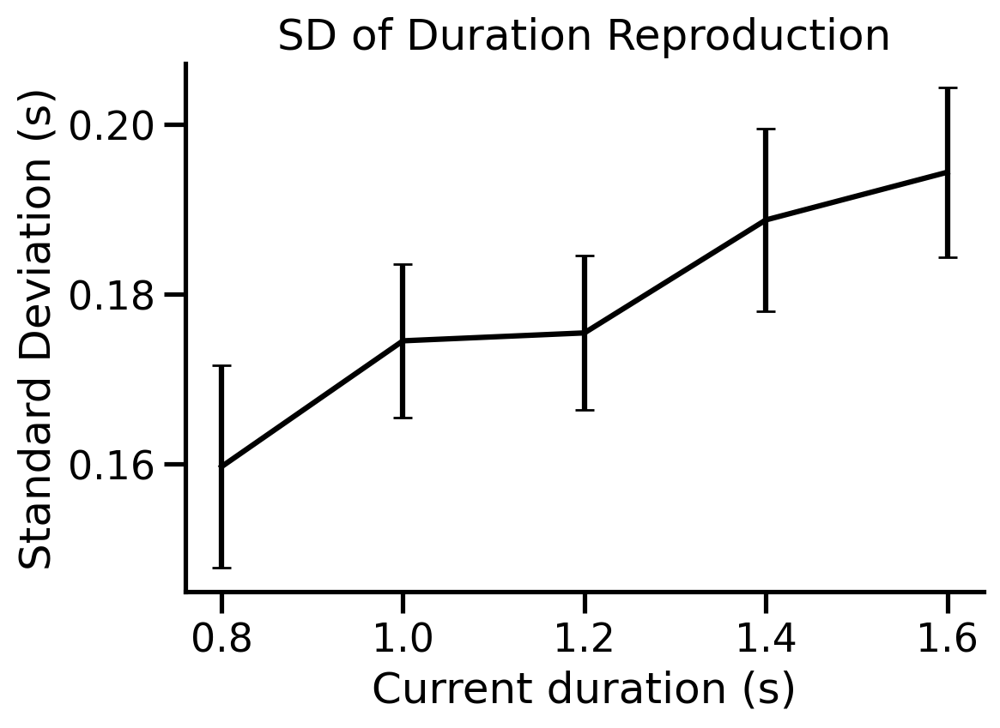

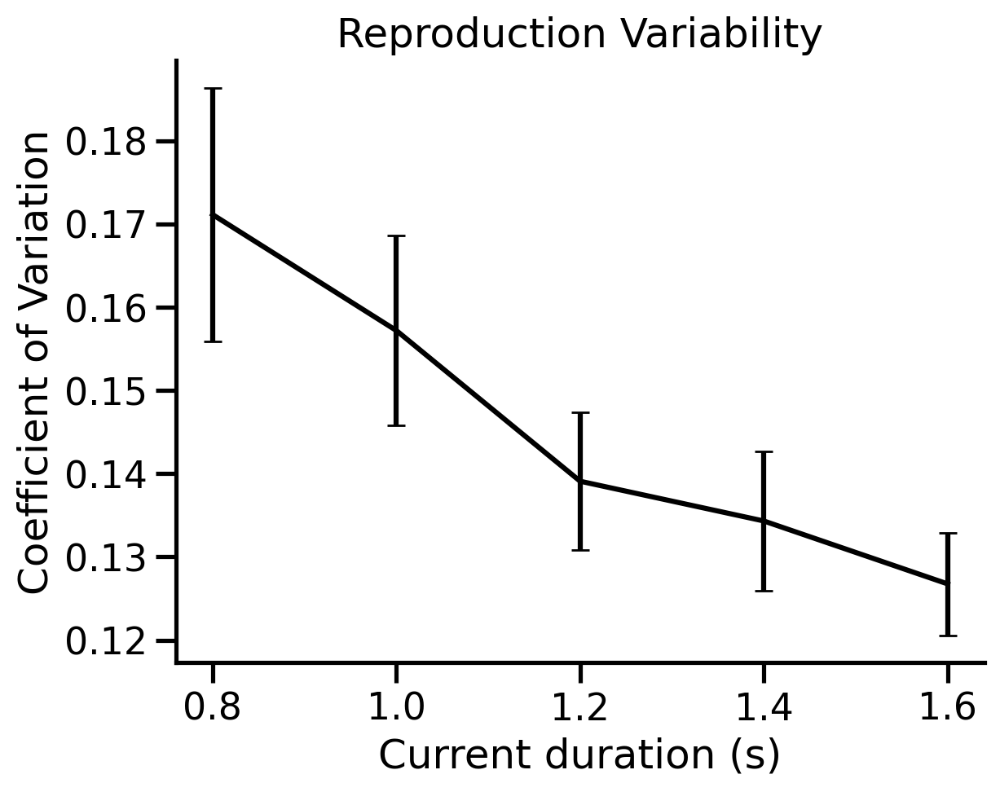

In [253]:
# plot SD vs current duration
mSDAll = mCVPar.groupby('curDur').agg({'std': ['count', 'mean', 'sem']}).reset_index()
mSDAll.columns = ['curDur', 'count', 'mSD', 'seSD']

fig, ax = plt.subplots(figsize=(6, 4))
plt.errorbar(x='curDur', y='mSD', yerr='seSD', data=mSDAll, color='black', capsize=4)
plt.xticks(mSDAll['curDur'])
plt.xlabel('Current duration (s)')
plt.ylabel('Standard Deviation (s)')
plt.title('SD of Duration Reproduction')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()
# plot CV vs current duration
fig, ax = plt.subplots()
plt.errorbar(x='curDur', y='mCV', yerr='seCV', data=mCVAll, color='black', capsize=4)
plt.xticks(mCVAll['curDur'])
plt.xlabel('Current duration (s)')
plt.ylabel('Coefficient of Variation')
plt.title('Reproduction Variability')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()


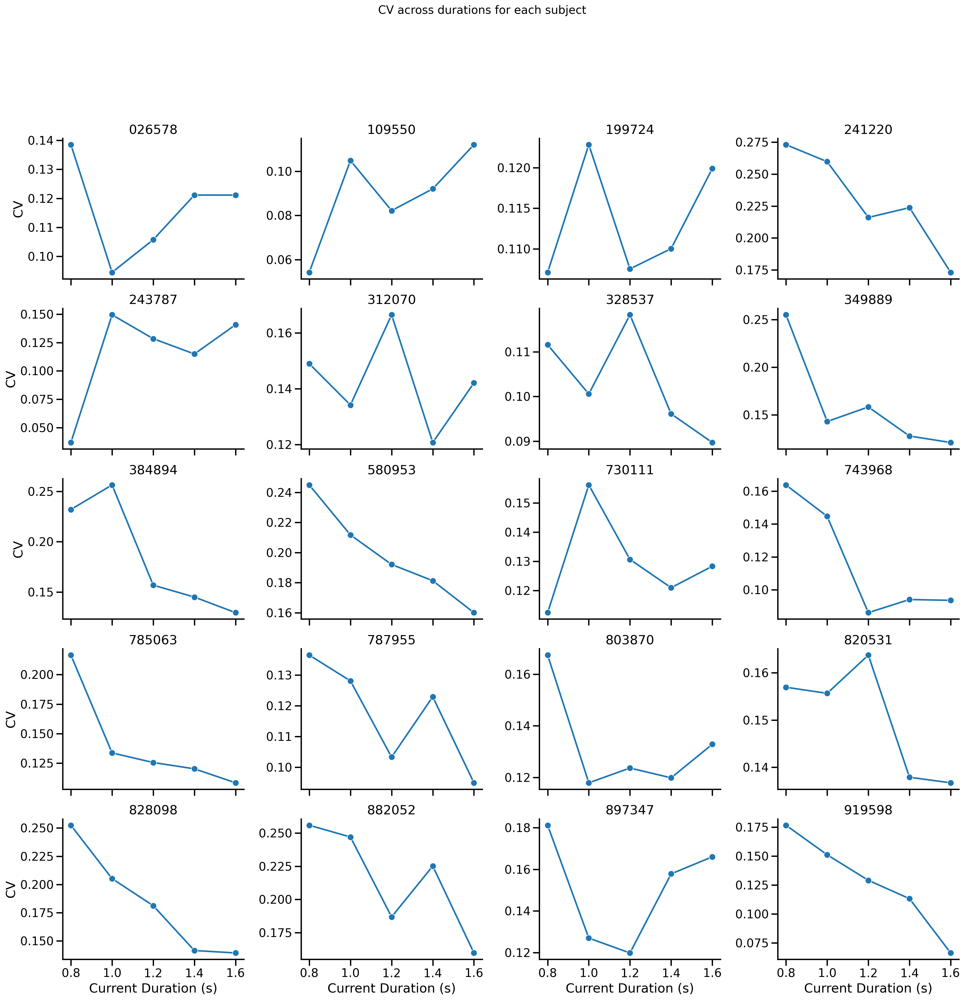

In [254]:
g = sns.relplot(
    data = mCVPar,kind = 'line', x = 'curDur',y = 'cv', col = 'subID', col_wrap = 4,marker = 'o',
    facet_kws={'sharey': False}, 
    height = 4,
    aspect = 1.2
)

g.set_axis_labels("Current Duration (s)", "CV")
g.set_titles("{col_name}") 
plt.subplots_adjust(top=0.85) 
g.fig.suptitle('CV across durations for each subject', fontsize=16)
plt.show()


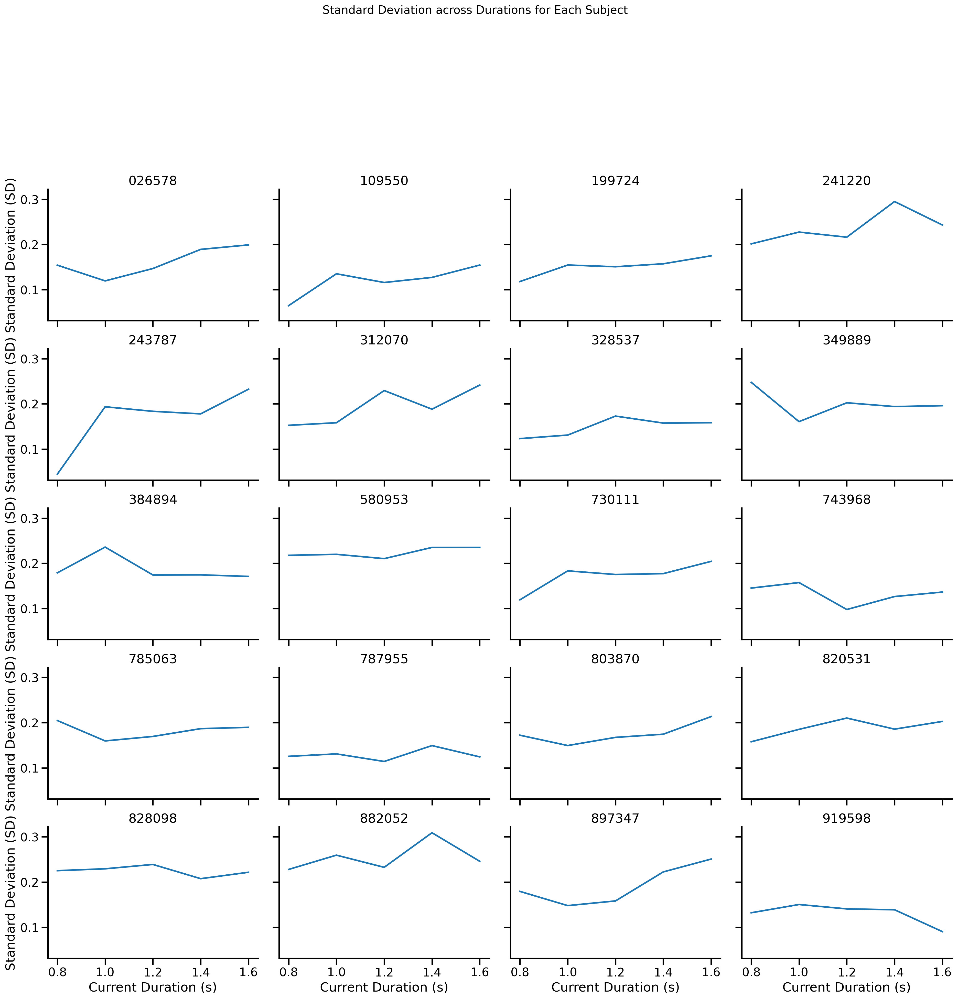

In [255]:
mSDPar = df.groupby(['subID', 'curDur']).agg(count=('rpr', 'count'), std=('rpr', 'std')).reset_index()
mSDPar['seSD'] = mSDPar['std'] / np.sqrt(mSDPar['count'])

# 使用 catplot 绘制分面图
g = sns.relplot( data=mSDPar, kind='line', x='curDur', y='std', col='subID',
    col_wrap=4,  height=4, aspect=1.2)

g.set_axis_labels("Current Duration (s)", "Standard Deviation (SD)")
g.set_titles("{col_name}")
plt.subplots_adjust(top=0.8)
g.fig.suptitle("Standard Deviation across Durations for Each Subject", fontsize=16)
plt.show()

##  3 Central tendency effect

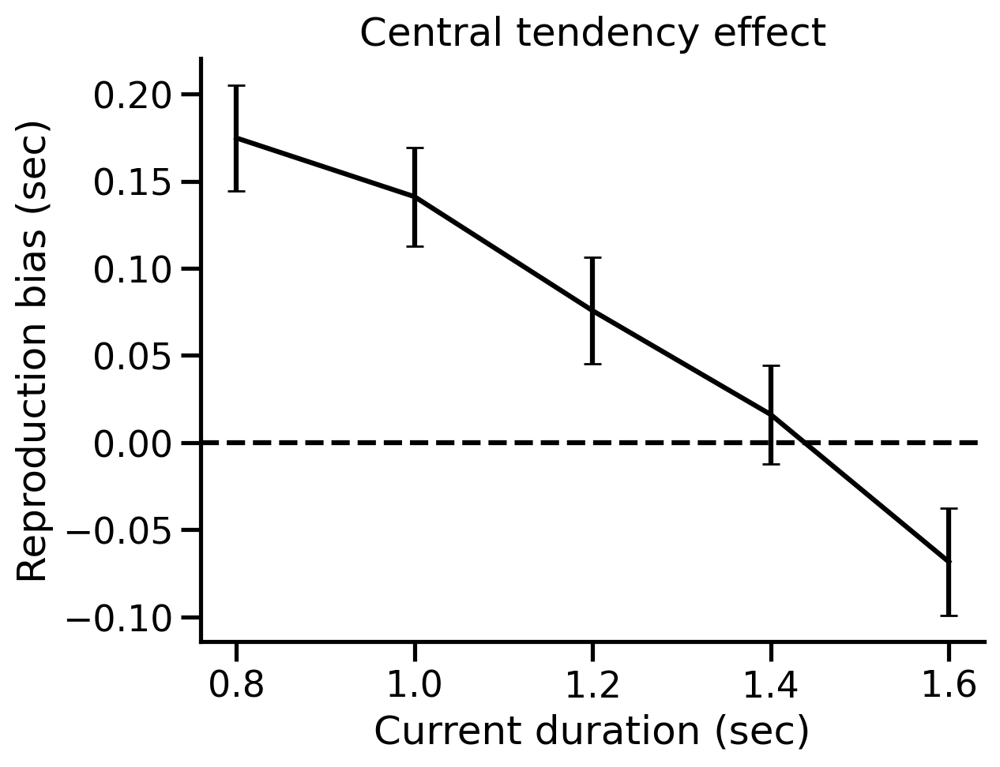

   curDur  count      mRpr     seRpr
0     0.8     20  0.974752  0.030454
1     1.0     20  1.141093  0.028246
2     1.2     20  1.275693  0.030590
3     1.4     20  1.416134  0.028269
4     1.6     20  1.531653  0.030618


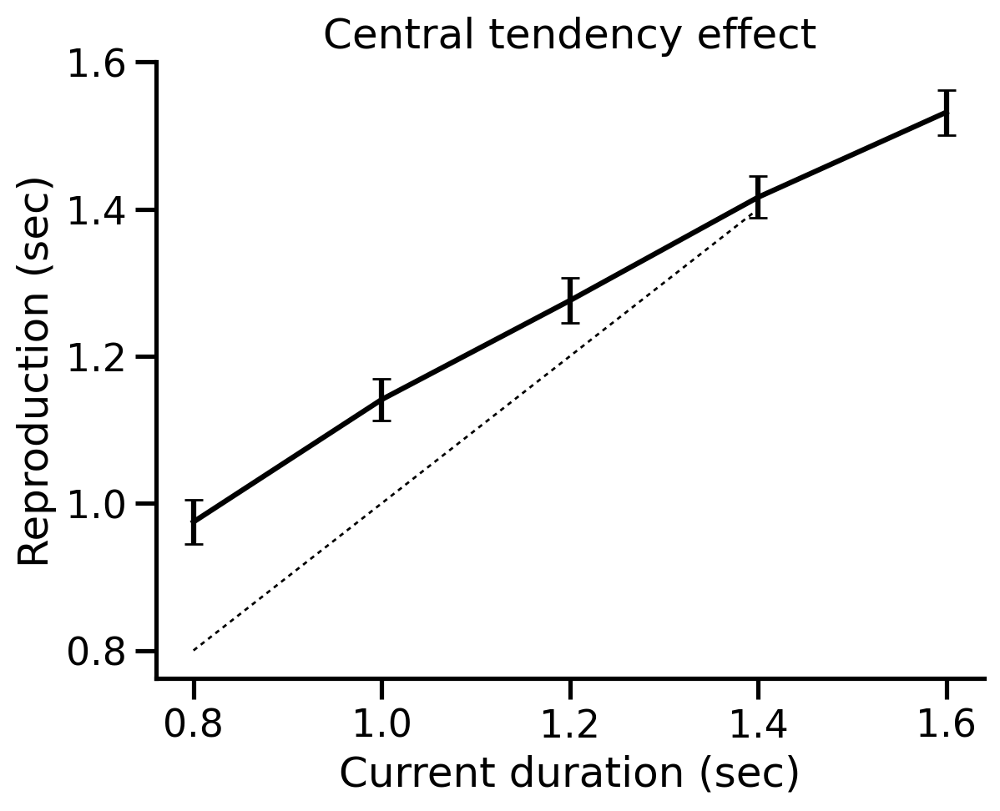

In [256]:
# Central tendency based on Reproduction Bias
mBiasDurPar = df.groupby(['subID', 'curDur']).curBias.mean().reset_index()
mBiasDurAll = mBiasDurPar.groupby('curDur').\
    agg({"curBias":["count","mean","sem"]}).reset_index()
mBiasDurAll.columns = ['curDur', 'count', 'mBias','seBias']
#print(mBiasDurAll)

# rmANOVA: mean bias as a factor of duration
# print('【rmANOVA: Duration main effect on mean bias】')
# aov_bias_dur = rmANOVA_gg_Long(mBiasDurPar, 'curBias', ['curDur'], 'nPar')
# print(aov_bias_dur)

# plot central tendency
fig, ax = plt.subplots()
plt.errorbar(x='curDur', y='mBias', yerr='seBias', data=mBiasDurAll, 
             color='black', capsize=4)
plt.axhline(y=0, color='black', linestyle='--')
plt.xticks(mBiasDurAll.curDur)
plt.xlabel('Current duration (sec)')
plt.ylabel('Reproduction bias (sec)')
plt.title('Central tendency effect')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

# # Central tendency based on Reproduction
mRprDurPar = df.groupby(['subID', 'curDur']).rpr.mean().reset_index()
mRprDurAll = mRprDurPar.groupby('curDur').\
     agg({"rpr":["count","mean","sem"]}).reset_index()
mRprDurAll.columns = ['curDur', 'count', 'mRpr','seRpr']
print(mRprDurAll)

 # plot central tendency
fig, ax = plt.subplots()
plt.errorbar(x='curDur', y='mRpr', yerr='seRpr', data=mRprDurAll, 
              color='black', capsize=4)
plt.plot([0.8, 1.4], [0.8, 1.4], 'k-', lw=1, dashes=[2, 2])
plt.xticks(mRprDurAll.curDur)
plt.xlabel('Current duration (sec)')
plt.ylabel('Reproduction (sec)')
plt.title('Central tendency effect')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

   preDur1back  count     mBias    seBias
0          0.8     20  0.040511  0.029096
1          1.0     20  0.044899  0.023992
2          1.2     20  0.061788  0.023793
3          1.4     20  0.070151  0.025028
4          1.6     20  0.098946  0.025234


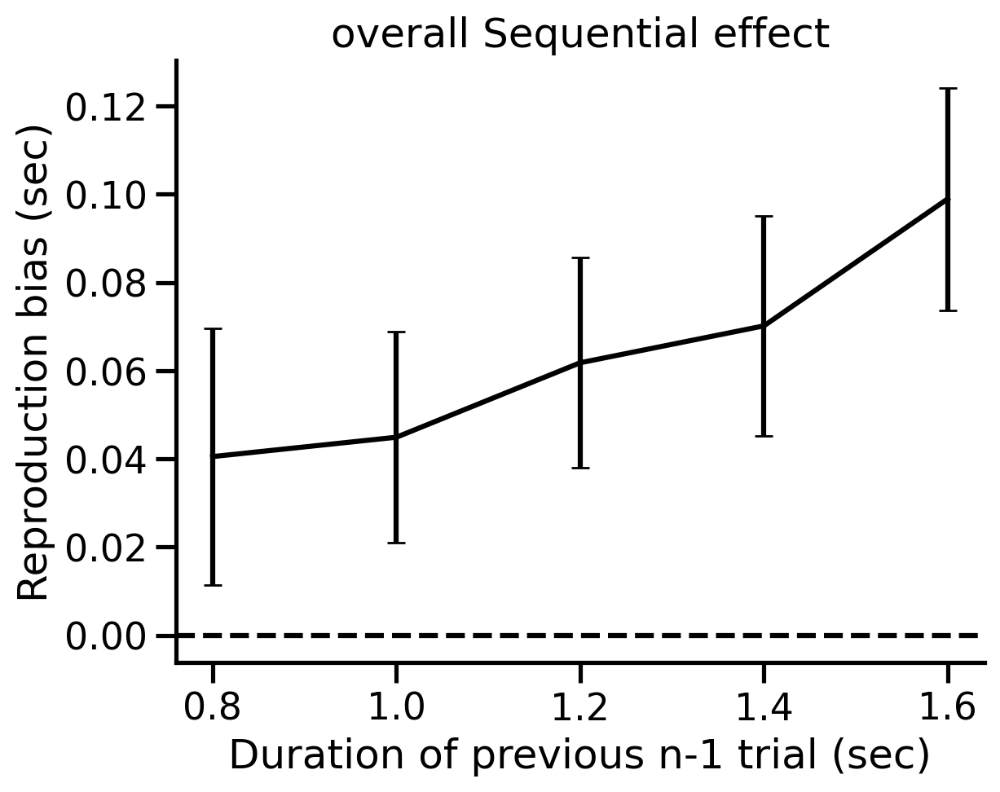

In [257]:
# overall Sequential effect (based on Reproduction Bias)
mBiasPreDurPar = df.groupby(['subID','preDur1back']).curBias.mean().reset_index()
mBiasPreDurAll = mBiasPreDurPar.groupby('preDur1back').\
    agg({"curBias":["count","mean","sem"]}).reset_index()
mBiasPreDurAll.columns = ['preDur1back', 'count', 'mBias','seBias']
print(mBiasPreDurAll)

# rmANOVA: mean bias as a factor of pre-duration
#print('【rmANOVA of mean Bias on preDuration】')
#aov_bias_preDur = rmANOVA_gg_Long(mBiasPreDurPar, 'curBias', ['preDur1back'], 'subID')
#print(aov_bias_preDur)

# plot sequential effect
fig, ax = plt.subplots()
plt.errorbar(x='preDur1back', y='mBias', yerr='seBias', data=mBiasPreDurAll, 
             color='black', capsize=4)
plt.axhline(y=0, color='black', linestyle='--')
plt.xticks(mBiasPreDurAll.preDur1back)
plt.xlabel('Duration of previous n-1 trial (sec)')
plt.ylabel('Reproduction bias (sec)')
plt.title('overall Sequential effect')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

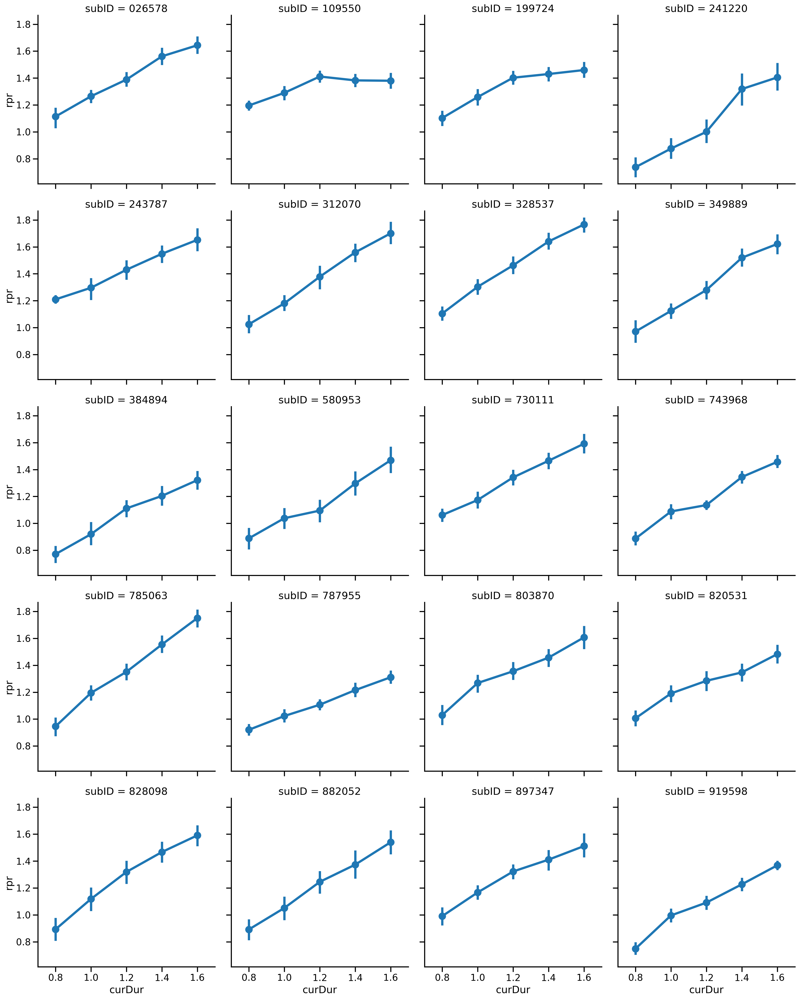

In [258]:
sns.catplot(data = df, kind = 'point', 
            x = 'curDur', y = 'rpr', col = 'subID', col_wrap = 4)

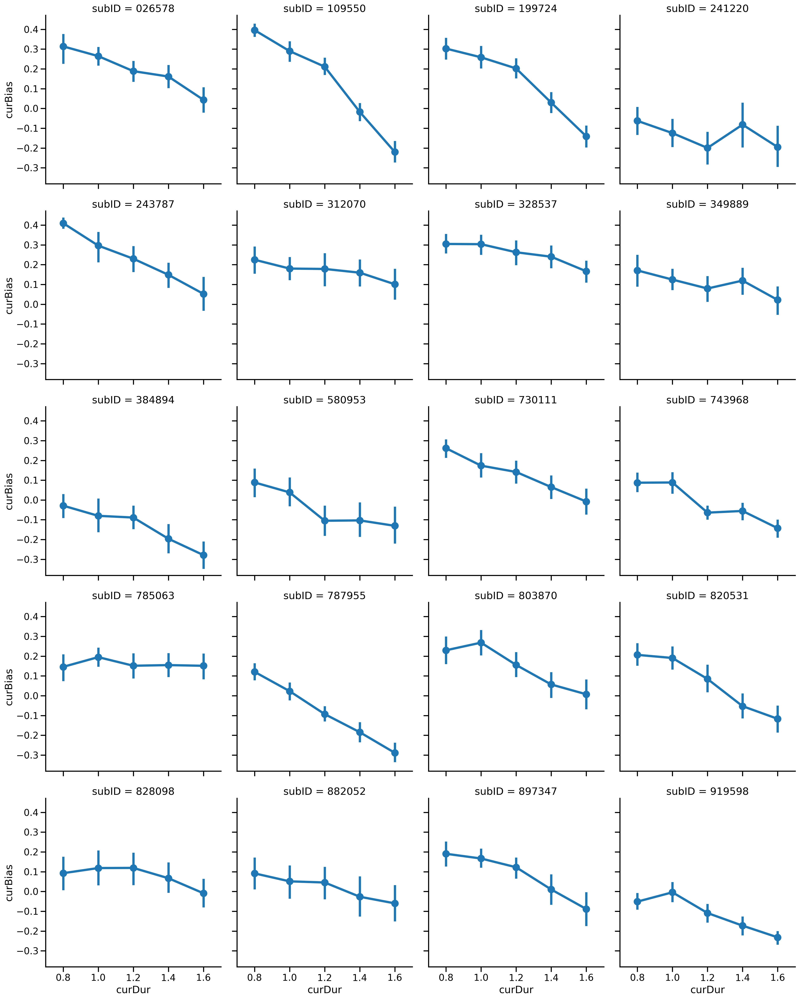

In [259]:
sns.catplot(data = df, kind = 'point', 
            x = 'curDur', y = 'curBias', col = 'subID', col_wrap = 4)

In [260]:
print(df['curCoherence'].value_counts())

curCoherence
0.3    1786
0.7    1786
Name: count, dtype: int64


### Now to check if our experiment manipulation is effective. Here we plot the std of the reproduced duration in each sampling points, 0.8s, 1.0s ....

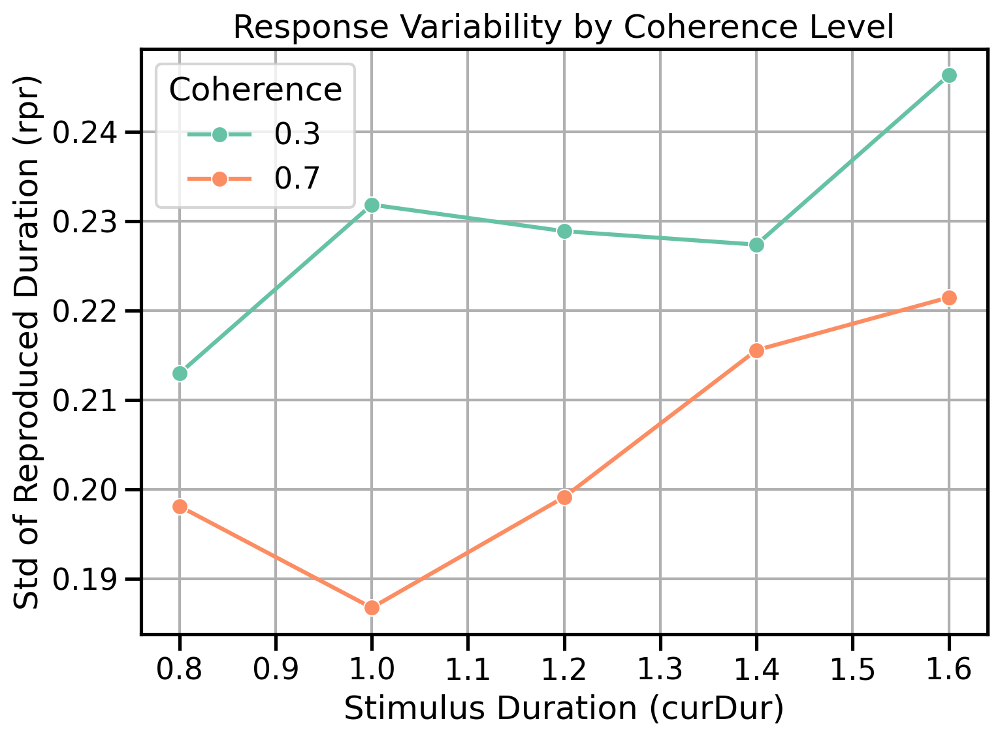

Duration 1.4: t = -5.061, p = 0.0000
Duration 1.6: t = -3.160, p = 0.0016
Duration 1.0: t = -4.535, p = 0.0000
Duration 1.2: t = -5.203, p = 0.0000
Duration 0.8: t = -5.884, p = 0.0000


In [261]:
# Group by duration and coherence, then compute SD of reproduction
df_sd = (
    df.groupby(["curDur", "curCoherence"])["rpr"]
    .std()
    .reset_index()
    .rename(columns={"rpr": "std_rpr"})
)

# Plot
plt.figure(figsize=(8, 6))
sns.lineplot(data=df_sd, x="curDur", y="std_rpr", hue="curCoherence", marker="o", palette="Set2")

plt.title("Response Variability by Coherence Level")
plt.xlabel("Stimulus Duration (curDur)")
plt.ylabel("Std of Reproduced Duration (rpr)")
plt.legend(title="Coherence")
plt.grid(True)
plt.tight_layout()
plt.show()
from scipy.stats import ttest_ind

for dur in df['curDur'].unique():
    sub = df[df['curDur'] == dur]
    std_03 = sub[sub['curCoherence'] == 0.3]['rpr']
    std_07 = sub[sub['curCoherence'] == 0.7]['rpr']
    
    t, p = ttest_ind(std_03, std_07, equal_var=False)
    print(f"Duration {dur}: t = {t:.3f}, p = {p:.4f}")

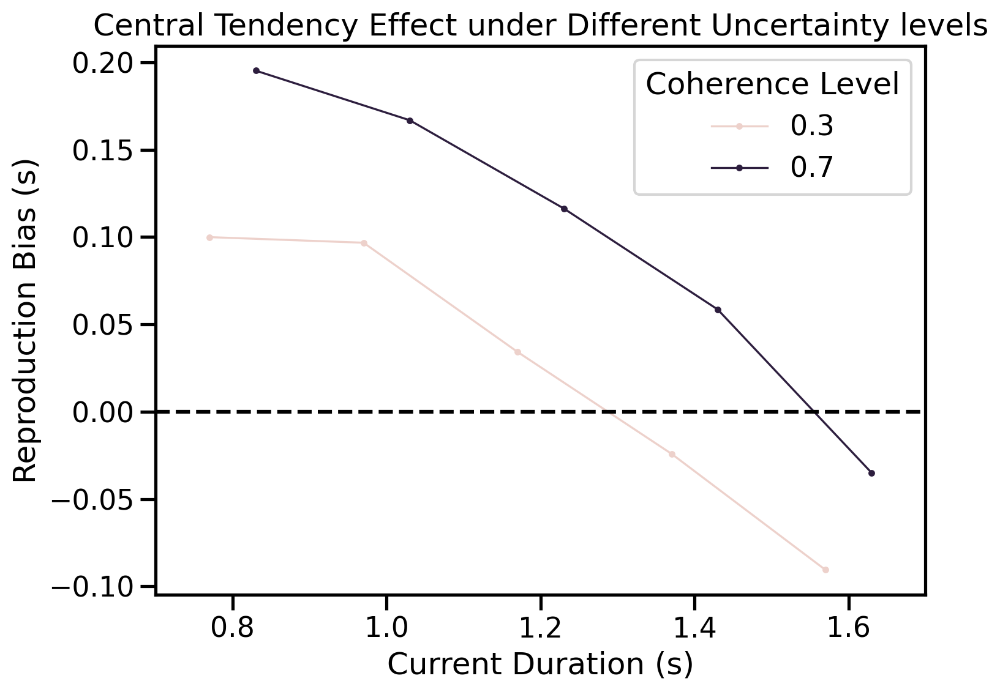

In [262]:
# Group by Uncertainty level
bias_grouped = df.groupby(['curCoherence', 'curDur'])['curBias'] \
    .agg(['count', 'mean', 'sem']).reset_index()
bias_grouped.columns = ['curCoherence', 'curDur', 'count', 'mBias', 'seBias']

# plot
plt.figure(figsize=(8, 6))
sns.pointplot(data=bias_grouped,
              x='curDur', y='mBias', hue='curCoherence',
              dodge=0.3, capsize=0.1, linewidth=1.2)
plt.axhline(0, color='black', linestyle='--')
plt.title("Central Tendency Effect under Different Uncertainty levels")
plt.xlabel("Current Duration (s)")
plt.ylabel("Reproduction Bias (s)")
plt.legend(title="Coherence Level")
plt.tight_layout()
plt.show()

### check central tendency in 4 transition conditons

C:\Users\10993\AppData\Local\Temp\ipykernel_55840\2318911830.py:8: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.2}` instead.

  sns.pointplot(data=bias_grouped,


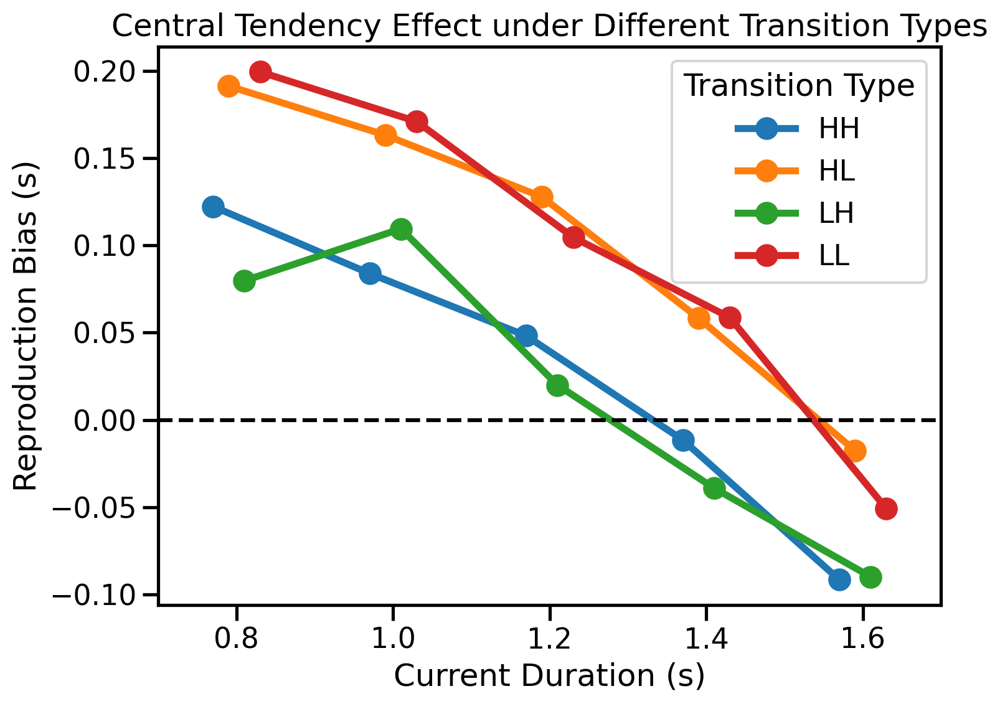

In [263]:
# Group by TransitionType & curDur 
bias_grouped = df.groupby(['TransitionType', 'curDur'])['curBias'] \
    .agg(['count', 'mean', 'sem']).reset_index()
bias_grouped.columns = ['TransitionType', 'curDur', 'count', 'mBias', 'seBias']

# plot
plt.figure(figsize=(8, 6))
sns.pointplot(data=bias_grouped,
              x='curDur', y='mBias', hue='TransitionType',
              dodge=0.3, capsize=0.1, errwidth=1.2)
plt.axhline(0, color='black', linestyle='--')
plt.title("Central Tendency Effect under Different Transition Types")
plt.xlabel("Current Duration (s)")
plt.ylabel("Reproduction Bias (s)")
plt.legend(title="Transition Type")
plt.tight_layout()
plt.show()

## 4 Sequential effect or Serial dependence

   preDur1back  count     mBias    seBias
0          0.8     20  0.040511  0.029096
1          1.0     20  0.044899  0.023992
2          1.2     20  0.061788  0.023793
3          1.4     20  0.070151  0.025028
4          1.6     20  0.098946  0.025234


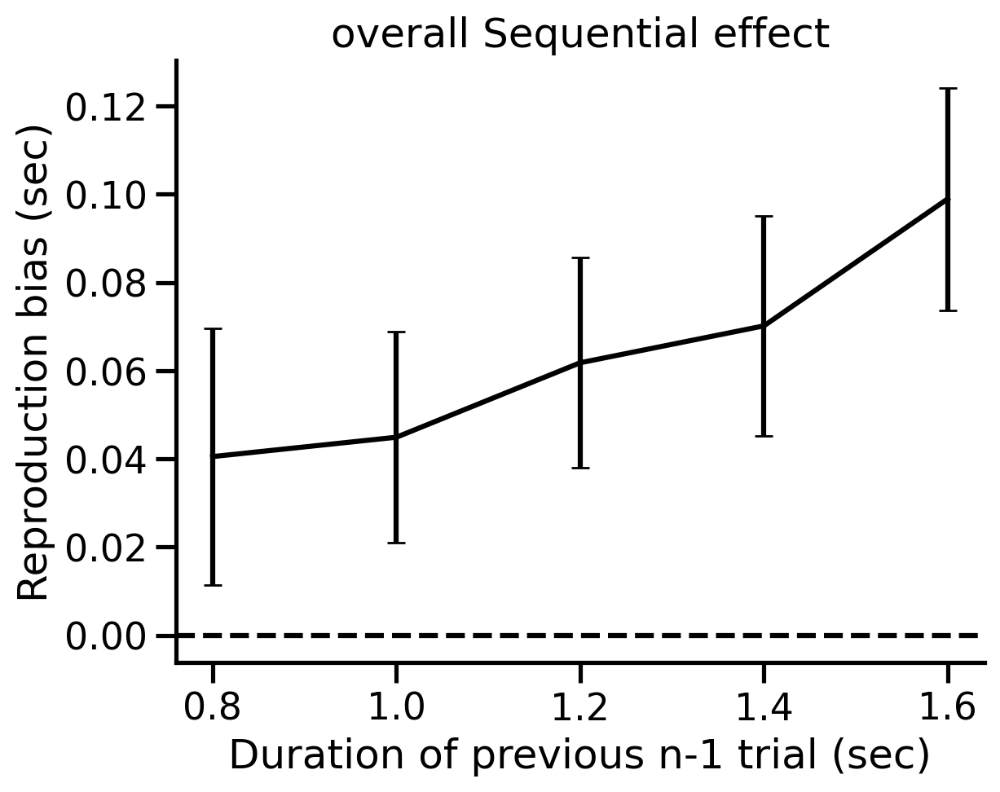

In [264]:
# overall Sequential effect (based on Reproduction Bias)
mBiasPreDurPar = df.groupby(['subID','preDur1back']).curBias.mean().reset_index()
mBiasPreDurAll = mBiasPreDurPar.groupby('preDur1back').\
    agg({"curBias":["count","mean","sem"]}).reset_index()
mBiasPreDurAll.columns = ['preDur1back', 'count', 'mBias','seBias']
print(mBiasPreDurAll)

# rmANOVA: mean bias as a factor of pre-duration
#print('【rmANOVA of mean Bias on preDuration】')
#aov_bias_preDur = rmANOVA_gg_Long(mBiasPreDurPar, 'curBias', ['preDur1back'], 'subID')
#print(aov_bias_preDur)

# plot sequential effect
fig, ax = plt.subplots()
plt.errorbar(x='preDur1back', y='mBias', yerr='seBias', data=mBiasPreDurAll, 
             color='black', capsize=4)
plt.axhline(y=0, color='black', linestyle='--')
plt.xticks(mBiasPreDurAll.preDur1back)
plt.xlabel('Duration of previous n-1 trial (sec)')
plt.ylabel('Reproduction bias (sec)')
plt.title('overall Sequential effect')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

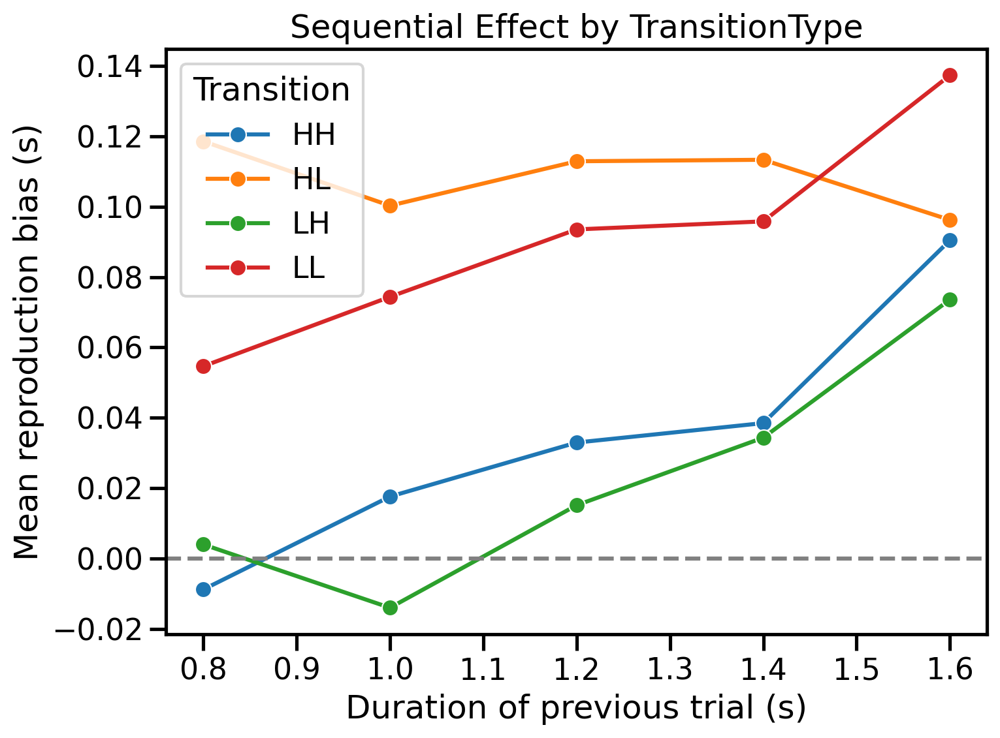

In [265]:
mBias_byTrans = df.groupby(['subID', 'TransitionType', 'preDur1back'])['curBias'].mean().reset_index()


# 再聚合：TransitionType × preDur
mBias_byTrans_all = mBias_byTrans.groupby(['TransitionType', 'preDur1back']).agg(
    count=('curBias', 'count'),
    mBias=('curBias', 'mean'),
    seBias=('curBias', 'sem')
).reset_index()
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.lineplot(
    data=mBias_byTrans_all,
    x='preDur1back',
    y='mBias',
    hue='TransitionType',
    marker='o', err_style="bars", err_kws={'capsize': 4}
)
plt.axhline(0, color='gray', linestyle='--')
plt.xlabel('Duration of previous trial (s)')
plt.ylabel('Mean reproduction bias (s)')
plt.title('Sequential Effect by TransitionType')
plt.legend(title='Transition')
plt.tight_layout()
plt.show()

Text(0.5, 0.98, 'Serial Dependence by Previous Duration')

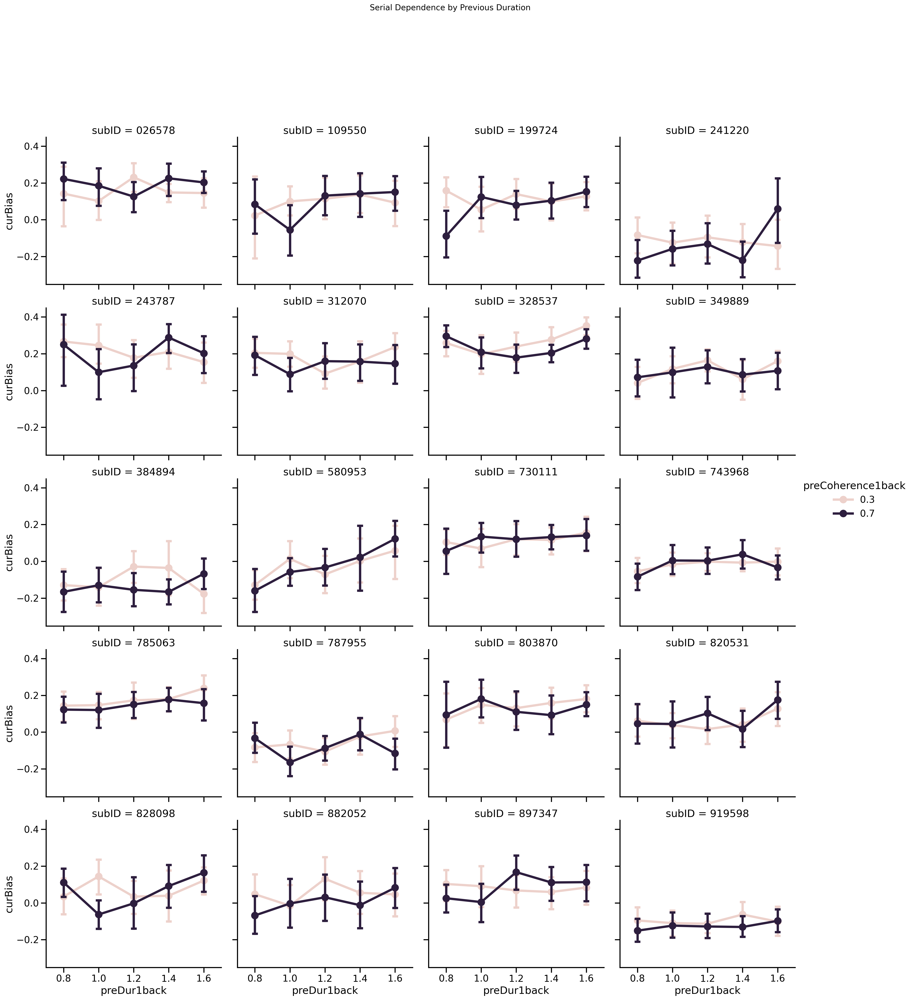

In [266]:
sns.catplot(data=df,  kind='point', x='preDur1back', y='curBias', hue='preCoherence1back', col='subID', col_wrap=4, capsize=0.1, height=5)
plt.subplots_adjust(top=0.85)
plt.suptitle("Serial Dependence by Previous Duration", fontsize=14)

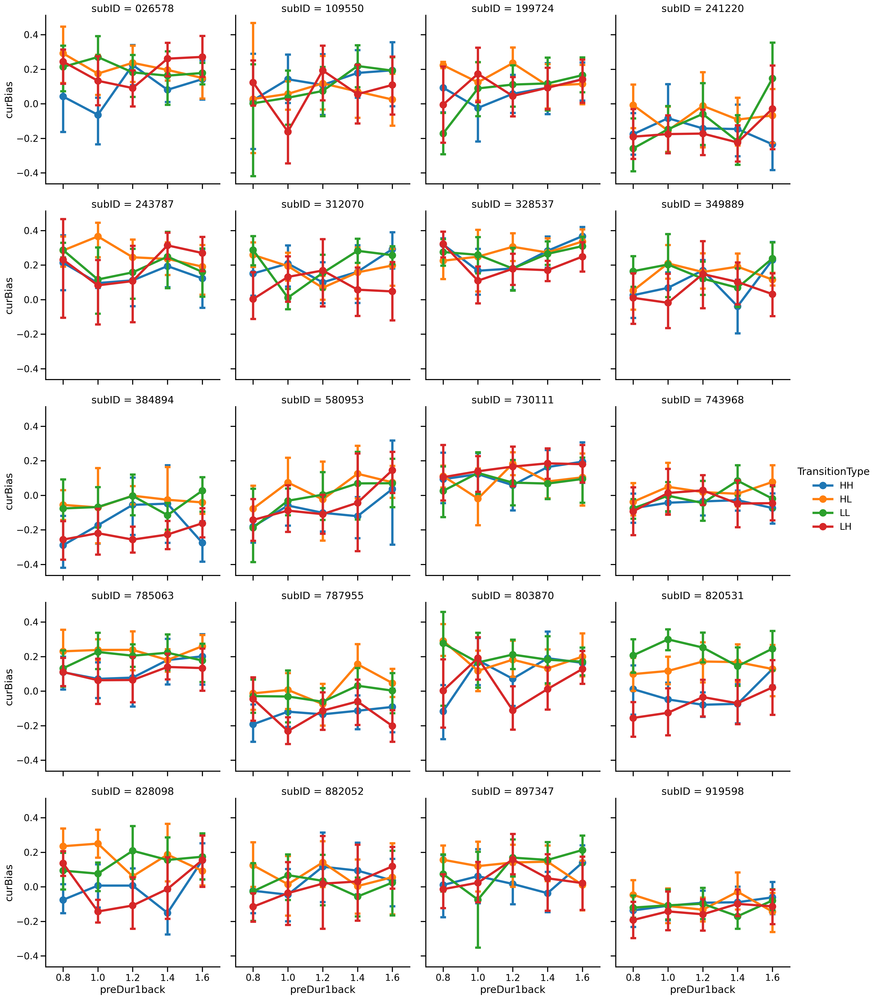

In [267]:
sns.catplot(data=df,kind='point', x='preDur1back', y='curBias', hue='TransitionType', col='subID', col_wrap=4,capsize=0.1,height=5)

## Plot the SD across Transition Types !

    subID TransitionType     slope
0  026578             HH  0.129515
1  026578             HL -0.101578
2  026578             LH  0.185671
3  026578             LL -0.074915
4  109550             HH  0.170815
\defferent transition type slopes:
TransitionType
HH    0.111811
HL   -0.012956
LH    0.102520
LL    0.091916
Name: slope, dtype: float64


<>:17: SyntaxWarning: invalid escape sequence '\d'
<>:17: SyntaxWarning: invalid escape sequence '\d'
C:\Users\10993\AppData\Local\Temp\ipykernel_55840\3713968512.py:17: SyntaxWarning: invalid escape sequence '\d'
  print("\defferent transition type slopes:")


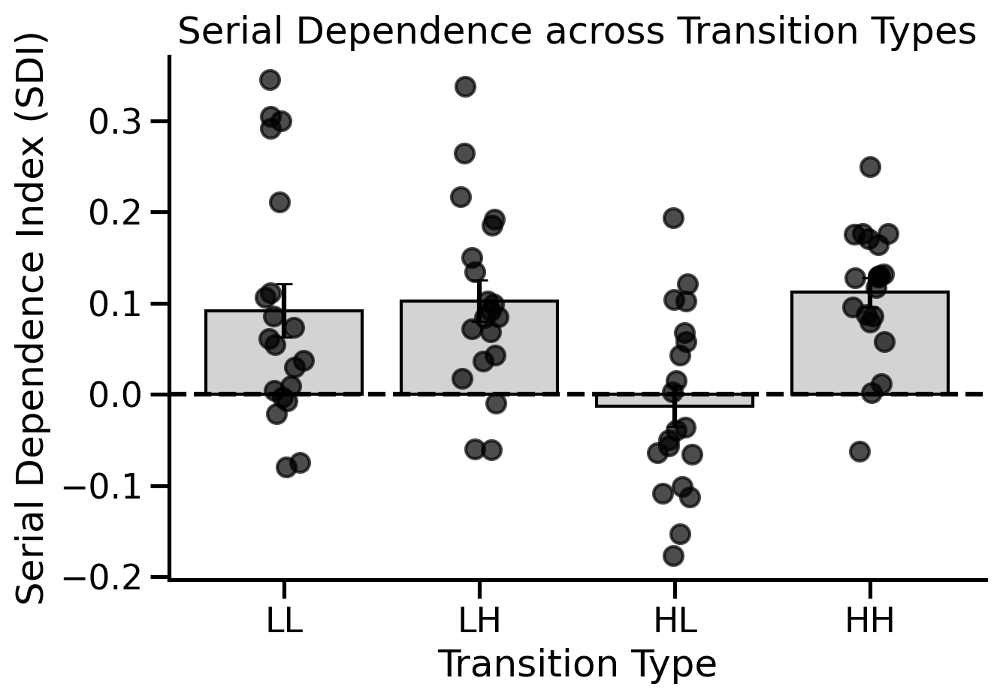


LL vs HH
            T  dof alternative  p-val          CI95%  cohen-d   BF10  power
T-test -0.557   19   two-sided  0.584  [-0.09, 0.05]     0.19  0.267  0.127

HL vs LH
            T  dof alternative  p-val           CI95%  cohen-d   BF10  power
T-test -3.484   19   two-sided  0.002  [-0.18, -0.05]     1.15  16.65  0.998

HH vs LH
            T  dof alternative  p-val          CI95%  cohen-d   BF10  power
T-test  0.325   19   two-sided  0.748  [-0.05, 0.07]    0.106  0.244  0.073

LL vs HL
            T  dof alternative  p-val         CI95%  cohen-d   BF10  power
T-test  2.943   19   two-sided  0.008  [0.03, 0.18]    0.908  5.961   0.97

LL vs LH
            T  dof alternative  p-val          CI95%  cohen-d   BF10  power
T-test -0.304   19   two-sided  0.764  [-0.08, 0.06]    0.091  0.242  0.067


In [268]:
import statsmodels.api as sm
slopes = []
for (sub_id, trans_type), group in df.groupby(['subID', 'TransitionType']):
    if len(group) >= 5: 
        X = group[ 'preDur1back']
        y = group['curBias']
        X = sm.add_constant(X) 
        model = sm.OLS(y, X).fit()
        slope = model.params['preDur1back']
        
        slopes.append({'subID': sub_id,'TransitionType': trans_type,'slope': slope })
df_slopes = pd.DataFrame(slopes)
print(df_slopes.head())
#  2. mean and sem
mean_slopes = df_slopes.groupby('TransitionType')['slope'].mean()
sem_slopes = df_slopes.groupby('TransitionType')['slope'].sem()
print("\defferent transition type slopes:")
print(mean_slopes)
# plot
fig, ax = plt.subplots(figsize=(7,5))

transition_order = ['LL', 'LH', 'HL', 'HH']

x_pos = np.arange(len(transition_order))

ax.bar(x_pos, mean_slopes[transition_order], 
       yerr=sem_slopes[transition_order], 
       capsize=4, color='lightgrey', edgecolor='black')
# for each subject, plot a scatter point
for i, trans in enumerate(transition_order):
    y = df_slopes[df_slopes['TransitionType']==trans]['slope']
    jitter = (np.random.rand(len(y)) - 0.5) * 0.2
    ax.scatter(np.full_like(y, x_pos[i]) + jitter, y, color='black', alpha=0.7)

ax.set_xticks(x_pos)
ax.set_xticklabels(transition_order)
ax.axhline(0, color='black', linestyle='--')
ax.set_xlabel('Transition Type')
ax.set_ylabel('Serial Dependence Index (SDI)')
ax.set_title('Serial Dependence across Transition Types')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()
# t-test
print("\nLL vs HH")
ll = df_slopes.query('TransitionType == "LL"')['slope']
hh = df_slopes.query('TransitionType == "HH"')['slope']
print(pg.ttest(ll, hh, paired=True).round(3))
print("\nHL vs LH")
hl = df_slopes.query('TransitionType == "HL"')['slope']
lh = df_slopes.query('TransitionType == "LH"')['slope']
print(pg.ttest(hl, lh, paired=True).round(3))
print("\nHH vs LH")
hl = df_slopes.query('TransitionType == "HH"')['slope']
lh = df_slopes.query('TransitionType == "LH"')['slope']
print(pg.ttest(hl, lh, paired=True).round(3))
print("\nLL vs HL")
ll = df_slopes.query('TransitionType == "LL"')['slope']
hl = df_slopes.query('TransitionType == "HL"')['slope']
print(pg.ttest(ll, hl, paired=True).round(3))
print("\nLL vs LH")
ll = df_slopes.query('TransitionType == "LL"')['slope']
hl = df_slopes.query('TransitionType == "LH"')['slope']
print(pg.ttest(ll, hl, paired=True).round(3))

In [269]:
def compare_SDI_two_conditions(df, cond_col, cond_vals, 
                               x_predict='preDur1back',
                               
                               y_target='curBias', 
                               group_col='subID', condition_names=('Cond1', 'Cond2'),
                               title='Serial Dependence Index Comparison'):
    """
    compare
    """

    df = df.copy()

    data1 = df[df[cond_col] == cond_vals[0]]
    data2 = df[df[cond_col] == cond_vals[1]]
   
    def get_slopes(data):
        slopes = []
        for sid, dsub in data.groupby(group_col):
            if dsub.shape[0] >= 5:
                slope = np.polyfit(dsub[x_predict], dsub[y_target], 1)[0]
                slopes.append(slope)
        return np.array(slopes)

    slope1 = get_slopes(data1)
    slope2 = get_slopes(data2)

    n = min(len(slope1), len(slope2))
    slope1 = slope1[:n]
    slope2 = slope2[:n]

    print(f"SDI ({condition_names[0]}): Mean = {slope1.mean():.3f}, SE = {slope1.std()/np.sqrt(n):.3f}")
    print(pg.ttest(slope1, 0).round(4))
    print(f" SDI ({condition_names[1]}): Mean = {slope2.mean():.3f}, SE = {slope2.std()/np.sqrt(n):.3f}")
    print(pg.ttest(slope2, 0).round(4))
    print(f" Paired comparison ({condition_names[0]} vs {condition_names[1]}):")
    print(pg.ttest(slope1, slope2, paired=True).round(4))

    X = np.arange(1, 3)
    Y = [slope1.mean(), slope2.mean()]
    yerr = [slope1.std()/np.sqrt(n), slope2.std()/np.sqrt(n)]

    fig, ax = plt.subplots(figsize=(6, 5))
    plt.bar(X, Y, color='lightgray', width=0.5)
    plt.errorbar(X, Y, yerr=yerr, color='black', capsize=4, linestyle='')

    jitter = (np.random.rand(n, 2) - 0.5) * 0.3
    plt.scatter(jitter[:,0]+1, slope1, color='black', alpha=0.8)
    plt.scatter(jitter[:,1]+2, slope2, color='black', alpha=0.8)

    plt.axhline(y=0, color='black', linestyle='--')
    plt.xticks(X, condition_names)
    plt.ylabel('Serial Dependence Index (slope)')
    plt.xlabel(cond_col)
    plt.title(title)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # p
    p_val = pg.ttest(slope1, slope2, paired=True)['p-val'].values[0]
    label_text = f'p = {p_val:.3f}' if p_val >= 0.001 else 'p < .001'
    ax.annotate(label_text, xy=(1.5, max(Y)*1.2), ha='center')
    ax.plot([1,2], [max(Y)*1.1]*2, color='black')
    ax.vlines([1,2], max(Y)*1.05, max(Y)*1.1, color='black')

    plt.tight_layout()
    plt.show()


SDI (high uncertainty): Mean = 0.104, SE = 0.014
            T  dof alternative  p-val         CI95%  cohen-d      BF10  power
T-test  7.238   19   two-sided    0.0  [0.07, 0.13]   1.6185  2.43e+04    1.0
 SDI (low uncertainty): Mean = 0.039, SE = 0.018
             T  dof alternative   p-val        CI95%  cohen-d   BF10   power
T-test  2.1214   19   two-sided  0.0473  [0.0, 0.08]   0.4744  1.452  0.5215
 Paired comparison (high uncertainty vs low uncertainty):
            T  dof alternative   p-val         CI95%  cohen-d   BF10   power
T-test  2.838   19   two-sided  0.0105  [0.02, 0.11]   0.8833  4.913  0.9628


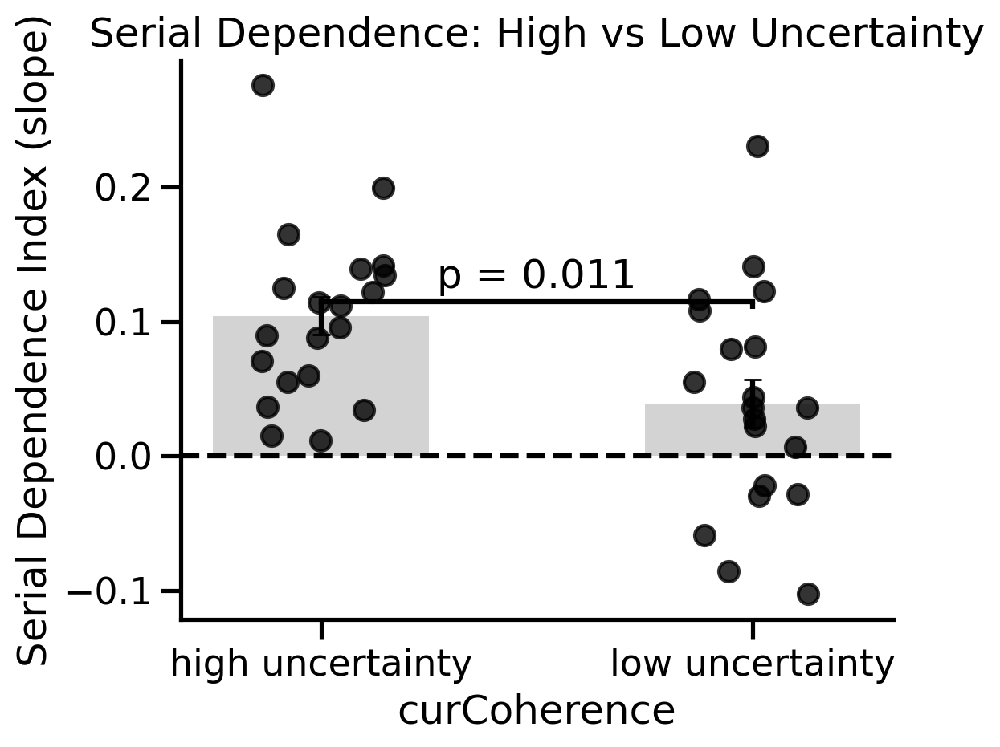

In [270]:

compare_SDI_two_conditions(
    df=df, cond_col='curCoherence', cond_vals=[0.3, 0.7], condition_names=['high uncertainty', 'low uncertainty'], title='Serial Dependence: High vs Low Uncertainty')


## 5 decisional carryover effect

In [271]:
def compute_preRpt(df):
    df = df.copy()
    df['sameDur'] = (df['curDur'] == df['preDur1back']).astype(int)
    df['preRpt'] = 0

    for sub_id, group in df.groupby('subID'):
        count_list = []
        count = 0
        for same in group['sameDur']:
            count = count + 1 if same else 0
            count_list.append(count)
        df.loc[group.index, 'preRpt'] = count_list

    return df


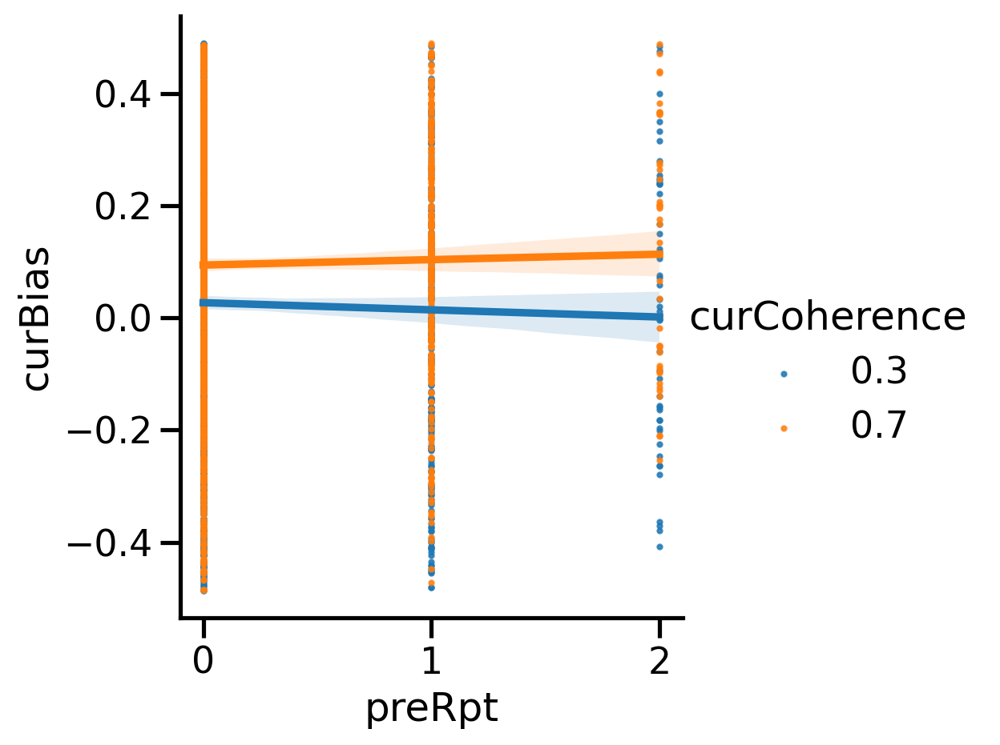

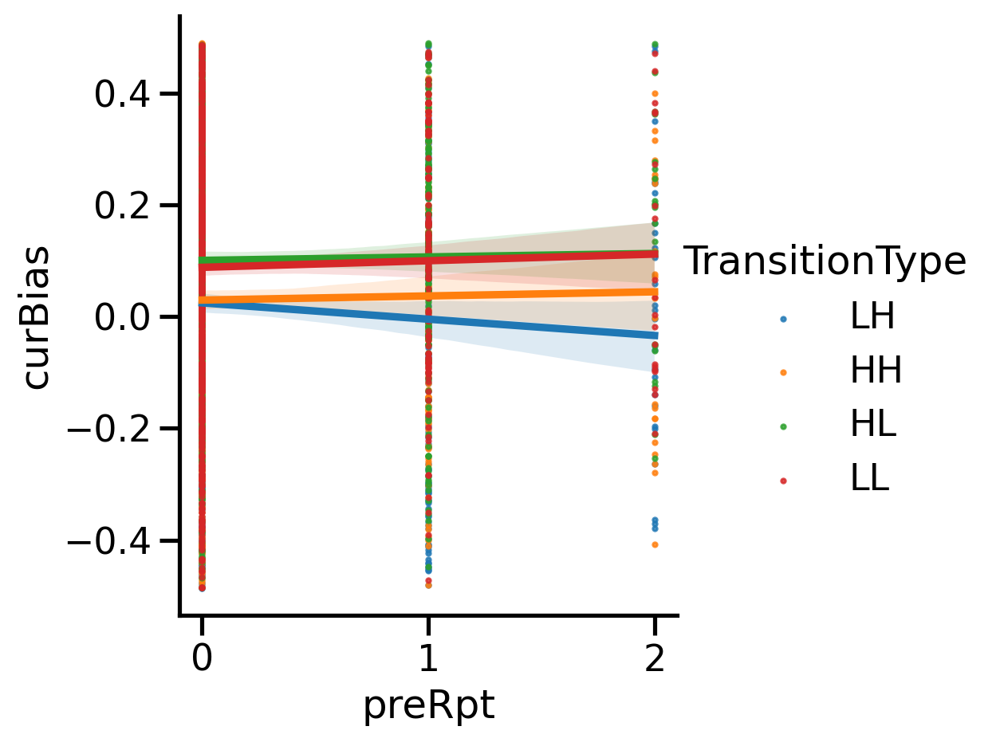

In [272]:
df = compute_preRpt(df)
sns.set_context("talk")
g = sns.lmplot( data=df.query('preRpt < 3'), x="preRpt", y="curBias", hue='curCoherence', scatter_kws={"s": 4})
g = sns.lmplot( data=df.query('preRpt < 3'), x="preRpt", y="curBias", hue='TransitionType', scatter_kws={"s": 4})


## 6 n-back serial dependence

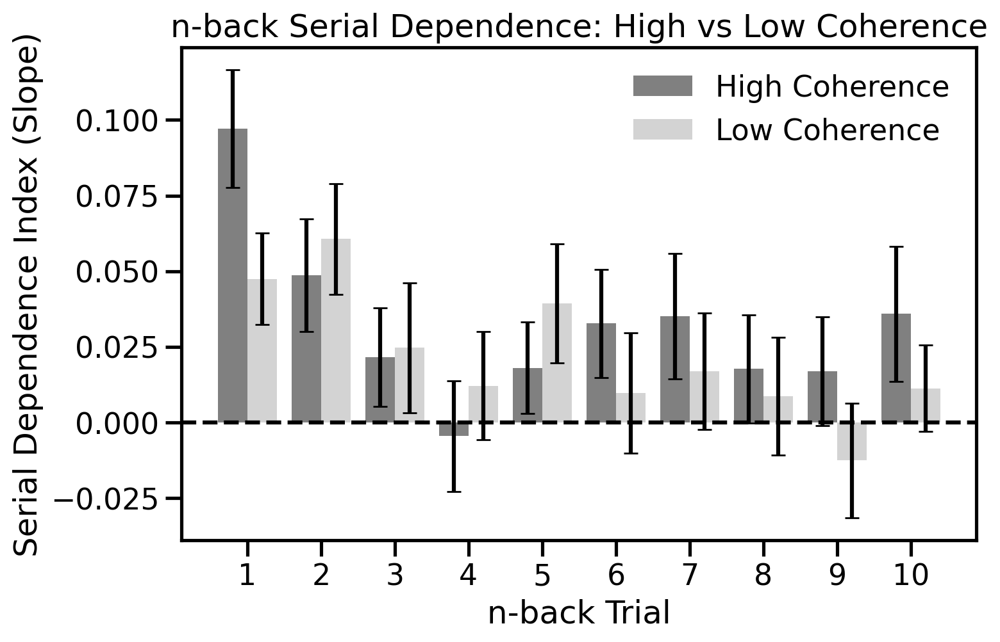

In [273]:
max_n_back = 10 

# 
dur_cols_list = [f'preDur{i}back' for i in range(1, max_n_back + 1)]
coh_cols_list = [f'preCoherence{i}back' for i in range(1, max_n_back + 1)]

# 
mean_sdi_high = []
se_sdi_high = []
mean_sdi_low = []
se_sdi_low = []

# N
nPar = df['subID'].nunique()

#  n-back 
for dur_col, coh_col in zip(dur_cols_list, coh_cols_list):
    # （High coherence = 0.7）
    data_high = df[df[coh_col] == 0.7]
    # （Low coherence = 0.3）
    data_low = df[df[coh_col] == 0.3]

    # （preDur → curBias）
    def calc_sdi(data):
        slopes = []
        for sid, df_sub in data.groupby('subID'):
            if df_sub.shape[0] >= 5:  # 至少5个点
                slope = np.polyfit(df_sub[dur_col], df_sub['curBias'], 1)[0]
                slopes.append(slope)
        return np.array(slopes)

    sdi_high = calc_sdi(data_high)
    sdi_low = calc_sdi(data_low)

    mean_sdi_high.append(np.mean(sdi_high))
    se_sdi_high.append(np.std(sdi_high) / np.sqrt(len(sdi_high)))
    mean_sdi_low.append(np.mean(sdi_low))
    se_sdi_low.append(np.std(sdi_low) / np.sqrt(len(sdi_low)))


x = np.arange(1, max_n_back + 1)
plt.figure(figsize=(8,5))
plt.bar(x-0.2, mean_sdi_high, width=0.4, color='gray', label="High Coherence")
plt.bar(x+0.2, mean_sdi_low, width=0.4, color='lightgray', label="Low Coherence")

plt.errorbar(x-0.2, mean_sdi_high, yerr=se_sdi_high, fmt='none', color='black', capsize=4)
plt.errorbar(x+0.2, mean_sdi_low, yerr=se_sdi_low, fmt='none', color='black', capsize=4)

plt.axhline(0, linestyle='--', color='black')
plt.xticks(x)
plt.xlabel('n-back Trial')
plt.ylabel('Serial Dependence Index (Slope)')
plt.title('n-back Serial Dependence: High vs Low Coherence')
plt.legend(frameon=False)
plt.grid(False)
plt.show()


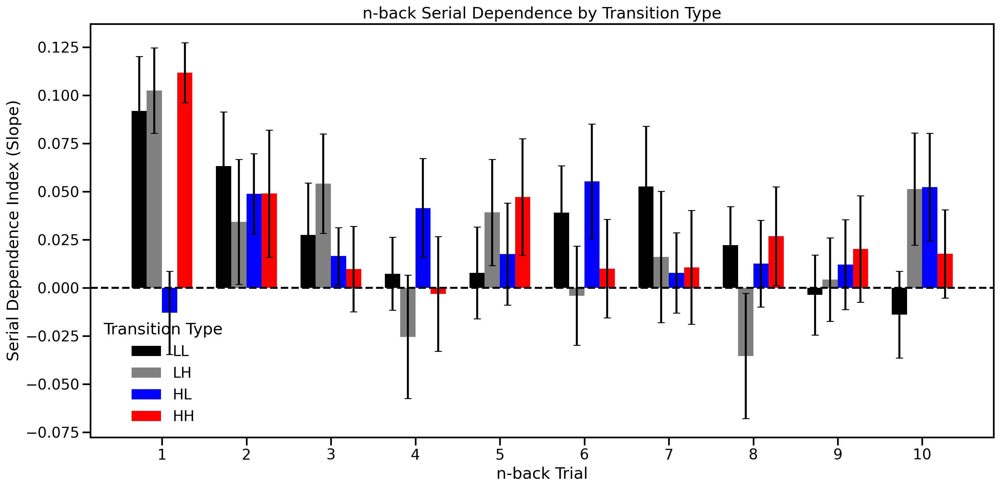

In [274]:
transitions = ['LL', 'LH', 'HL', 'HH']
sdi_results = {t: {'mean': [], 'se': []} for t in transitions}


# slope
for dur_col in dur_cols_list:
    for t in transitions:
        data_t = df[df['TransitionType'] == t]

        def calc_sdi(data):
            slopes = []
            for sid, df_sub in data.groupby('subID'):
                if df_sub.shape[0] >= 5 and dur_col in df_sub.columns:
                   
                    df_sub = df_sub.dropna(subset=[dur_col, 'curBias'])
                    if df_sub.shape[0] >= 5:
                        slope = np.polyfit(df_sub[dur_col], df_sub['curBias'], 1)[0]
                        slopes.append(slope)
            return np.array(slopes)

        sdi = calc_sdi(data_t)
        sdi_results[t]['mean'].append(np.mean(sdi))
        sdi_results[t]['se'].append(np.std(sdi) / np.sqrt(len(sdi)))

# visualization
x = np.arange(1, max_n_back + 1)
bar_width = 0.18
colors = {'LL': 'black', 'LH': 'gray', 'HL': 'blue', 'HH': 'red'}

plt.figure(figsize=(16, 8))
for i, t in enumerate(transitions):
    plt.bar(x + (i - 1.5) * bar_width,
            sdi_results[t]['mean'],
            width=bar_width,
            label=t,
            color=colors[t])
    
    plt.errorbar(x + (i - 1.5) * bar_width,
                 sdi_results[t]['mean'],
                 yerr=sdi_results[t]['se'],
                 fmt='none',
                 capsize=4,
                 color='black')

plt.axhline(0, linestyle='--', color='black')
plt.xticks(x)
plt.xlabel('n-back Trial')
plt.ylabel('Serial Dependence Index (Slope)')
plt.title('n-back Serial Dependence by Transition Type')
plt.legend(title="Transition Type", frameon=False)
plt.grid(False)
plt.tight_layout()
plt.show()


## 7 Linear mixed model (Important part)

### 7.1 basic model

In [275]:
import statsmodels.formula.api as smf

model_simple = smf.mixedlm(
    "curBias ~ preDur1back", 
    data=df,                
    groups=df["subID"]       #
)
result_simple = model_simple.fit()
print(result_simple.summary())


        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: curBias 
No. Observations: 3572    Method:             REML    
No. Groups:       20      Scale:              0.0430  
Min. group size:  136     Log-Likelihood:     509.0042
Max. group size:  216     Converged:          Yes     
Mean group size:  178.6                               
------------------------------------------------------
            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   -0.025    0.029 -0.855 0.392 -0.081  0.032
preDur1back  0.073    0.013  5.768 0.000  0.048  0.097
Group Var    0.012    0.019                           




### 7.2 Mixed Linear Model with Uncertainty

In [276]:
df['Uncertainty'] = df['curCoherence'].apply(lambda x: 'High' if x == 0.3 else 'Low')
model = smf.mixedlm(    "curBias ~ preDur1back * Uncertainty", data=df, groups=df["subID"]).fit()
print(model.summary())

                  Mixed Linear Model Regression Results
Model:                   MixedLM       Dependent Variable:       curBias 
No. Observations:        3572          Method:                   REML    
No. Groups:              20            Scale:                    0.0416  
Min. group size:         136           Log-Likelihood:           561.3718
Max. group size:         216           Converged:                Yes     
Mean group size:         178.6                                           
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                      -0.107    0.033 -3.278 0.001 -0.170 -0.043
Uncertainty[T.Low]              0.161    0.031  5.269 0.000  0.101  0.221
preDur1back                     0.111    0.018  6.290 0.000  0.076  0.145
preDur1back:Uncertainty[T.Low] -0.073    0.025 -2.984 0.

#### **Model Structure**

* **Dependent variable**: `curBias`
* **Fixed effects**:

  * `Uncertainty` (High vs. Low)
  * `preDur1back` (Duration of the previous trial)
  * `preDur1back × Uncertainty` interaction


---

#### **Key Results**

| Term                    | Coef.    | p-value    | Interpretation                                                                         |
| ----------------------- | -------- | ---------- | -------------------------------------------------------------------------------------- |
| **Intercept High**      | `-0.107` | **0.001**  | Under **high uncertainty**, the baseline bias is negative    |
| **Uncertainty\[T.Low]** | `+0.161` | **<0.001** | In **low uncertainty**, bias shifts positively,participants tend to **reproduce more** |
| **preDur1back**         | `+0.111` | **<0.001** | clear **serial dependence**     |
| **Interaction**         | `−0.073` | **0.003**  | Under **low uncertainty**, the influence of `preDur1back` is significantly reduced     |
| **Group Var**           | `0.012`  | –          | Small between-subject variability                                         |

---

#### Interpretation Summary

- Participants tend to **reproduce longer durations** if the previous one was longer — that's **serial dependence**.
- This effect is **stronger when uncertainty is high** — people rely more on the last trial when they’re unsure, I think this could be the effect of **Decision-making under uncertainty**.
- The positive shift (**+0.161**) under low uncertainty shows that participants are generally **more consistent** in that condition.



### 7.3 Mixed Linear Model with TransitionType

In [277]:
model = smf.mixedlm("curBias ~ preDur1back * TransitionType", data=df, groups=df["subID"]).fit()
print(model.summary())


                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        curBias 
No. Observations:        3572           Method:                    REML    
No. Groups:              20             Scale:                     0.0415  
Min. group size:         136            Log-Likelihood:            554.9273
Max. group size:         216            Converged:                 Yes     
Mean group size:         178.6                                             
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                        -0.105    0.039 -2.690 0.007 -0.182 -0.029
TransitionType[T.HL]              0.223    0.043  5.208 0.000  0.139  0.307
TransitionType[T.LH]             -0.005    0.044 -0.103 0.918 -0.090  0.081
TransitionType[T.LL]           

###   Summary 

- Clear **serial dependence**: longer previous durations lead to larger current reproduction bias (`+0.115`, p < 0.001).
- In the **HL condition** (High → Low uncertainty), this effect is significantly **reversed** (`–0.126`, p < 0.001).Here could be repulsion..
- In **LH** and **LL** conditions, the interaction is **not significant**, meaning the serial dependence remains unchanged.
- The **baseline bias** (in HH) is slightly negative (`–0.105`), suggesting participants tend to **underestimate** the time.
- **Between-subject variance** (`Group Var = 0.012`), so this pattern is common partton across participants.


In [278]:
model = smf.mixedlm(
    "curBias ~ preDur1back * TransitionType",
    data=df,
    groups=df["subID"]
).fit()
print(model.summary())


                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        curBias 
No. Observations:        3572           Method:                    REML    
No. Groups:              20             Scale:                     0.0415  
Min. group size:         136            Log-Likelihood:            554.9273
Max. group size:         216            Converged:                 Yes     
Mean group size:         178.6                                             
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                        -0.105    0.039 -2.690 0.007 -0.182 -0.029
TransitionType[T.HL]              0.223    0.043  5.208 0.000  0.139  0.307
TransitionType[T.LH]             -0.005    0.044 -0.103 0.918 -0.090  0.081
TransitionType[T.LL]           

### 7.4 Mixed Linear Model with dicision
#### -whether the previous response being "Long" or "Short" predicts current bias (curBias)?
#### -whether this effect varies by TransitionType — especially in the LL condition?

### Step 1: Mark each trial as "Long" or "Short" relative to subject mean

In [279]:
subject_means = df.groupby("subID")["rpr"].mean().reset_index().rename(columns={"rpr": "mean_rpr"})
df = df.merge(subject_means, on="subID")

#  Long/Short
df["RespType"] = np.where(df["rpr"] > df["mean_rpr"], "Long", "Short")
df["preResp"] = df.groupby("subID")["RespType"].shift(1)
df = df.dropna(subset=["preResp"]).copy()



### Step 2: Convert TransitionType and preResp to categorical 

In [280]:
df["TransitionType"] = pd.Categorical(df["TransitionType"], categories=["LL", "LH", "HL", "HH"], ordered=False)
df["preResp"] = pd.Categorical(df["preResp"], categories=["Long", "Short"], ordered=False)


### Step 3: Fit the linear mixed model

In [281]:
# Fit model with 3-way interaction
model = smf.mixedlm("curBias ~ preDur1back * TransitionType * preResp",df, groups=df["subID"])
result = model.fit(method='lbfgs')  # more stable than default 'powell'
print(result.summary())

                                 Mixed Linear Model Regression Results
Model:                              MixedLM                 Dependent Variable:                 curBias
No. Observations:                   3552                    Method:                             REML   
No. Groups:                         20                      Scale:                              0.0408 
Min. group size:                    135                     Log-Likelihood:                     inf    
Max. group size:                    215                     Converged:                          Yes    
Mean group size:                    177.6                                                              
-------------------------------------------------------------------------------------------------------
                                                  Coef.   Std.Err.    z    P>|z|    [0.025     0.975]  
-------------------------------------------------------------------------------------------------

c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2054: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2245: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite

###   Summary 
- We did not find that ‘whether the previous response was Long’ significantly affects the current reproduction bias, and the decision residual effect is not significant in our data.


## 7.5 Now curBias is actually a mix of ‘perception + decision’. So we can try Model A: Introducing a current duration (curDur) main effect control for perceived task (0.8s, 1.0s,....)

In [282]:
df["TransitionType"] = pd.Categorical(df["TransitionType"], categories=["LL", "LH", "HL", "HH"], ordered=False)

model = smf.mixedlm("curBias ~ curDur + preDur1back * TransitionType", df, groups=df["subID"])
result = model.fit(method='lbfgs')
print(result.summary())


                         Mixed Linear Model Regression Results
Model:                        MixedLM            Dependent Variable:            curBias
No. Observations:             3552               Method:                        REML   
No. Groups:                   20                 Scale:                         0.0340 
Min. group size:              135                Log-Likelihood:                inf    
Max. group size:              215                Converged:                     Yes    
Mean group size:              177.6                                                    
---------------------------------------------------------------------------------------
                                 Coef.   Std.Err.     z    P>|z|    [0.025     0.975]  
---------------------------------------------------------------------------------------
Intercept                        -0.000 147061.526  -0.000 1.000 -288235.294 288235.294
TransitionType[T.LH]             -0.110      0.039  -2.77

c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2054: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2245: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
c:\Users\10993\.conda\envs\pymc_env\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite

####  Key Findings:

* **`curDur`**: Strong negative effect (**–0.308**, p < 0.001)
  → Participants tend to **underestimate** longer durations.

* **`preDur1back`**: Positive and significant (**+0.078**, p < 0.001)
  → Clear **attractive serial dependence**.

* **TransitionType main effects**:

  * **LH**: –0.110 (p = 0.005) → negative bias
  * **HL**: +0.095 (p = 0.015) → positive bias
  * **HH**: –0.078 (p = 0.046)

* **Interaction — `preDur1back × HL`**:
  Significant negative interaction (**–0.071**, p = 0.024)
  → Serial dependence is **reduced or reversed** in HL condition, suggesting a **repulsion effect**.

* **Other interactions**: Not significant

* **Group variance ≈ 0**
  → Pattern is consistent across participants

---

####  Summary:

By controlling for perceptipng task itself using `curDur`, we found robust serial dependence in general, and found that this effect **weakens or reverses under HL transitions**. 

```



## 8 DVI

In [283]:
def compute_preRpt(df):
    df = df.copy()
    df['sameDur'] = (df['curDur'] == df['preDur1back']).astype(int)
    df['preRpt'] = 0

    for sub_id, group in df.groupby('subID'):
        count_list = []
        count = 0
        for same in group['sameDur']:
            count = count + 1 if same else 0
            count_list.append(count)
        df.loc[group.index, 'preRpt'] = count_list

    return df

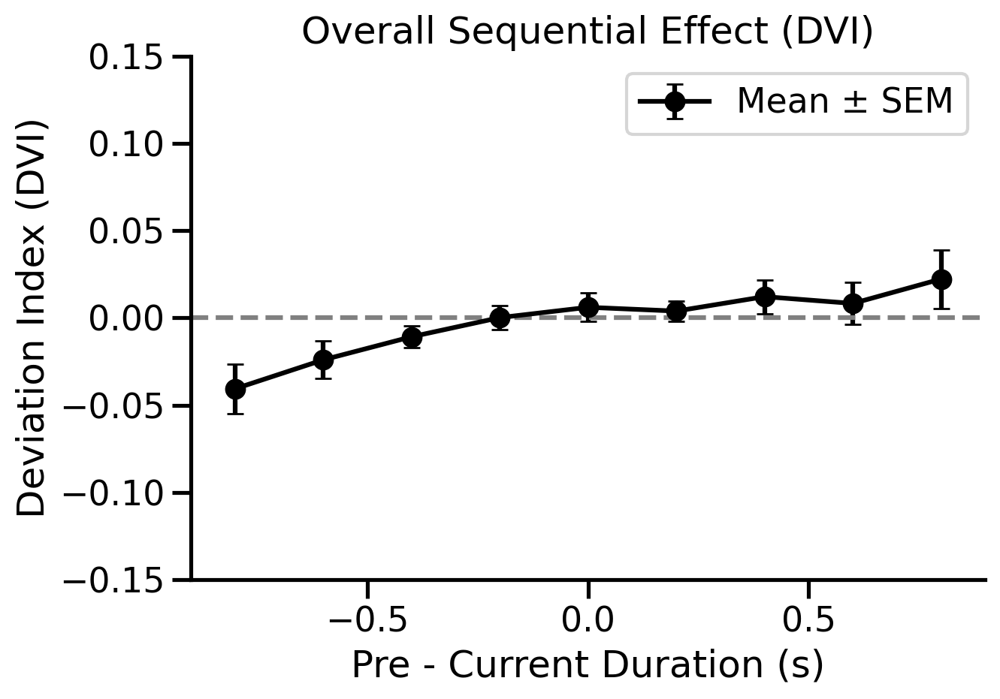

In [284]:
plot_dvi_curve(df)

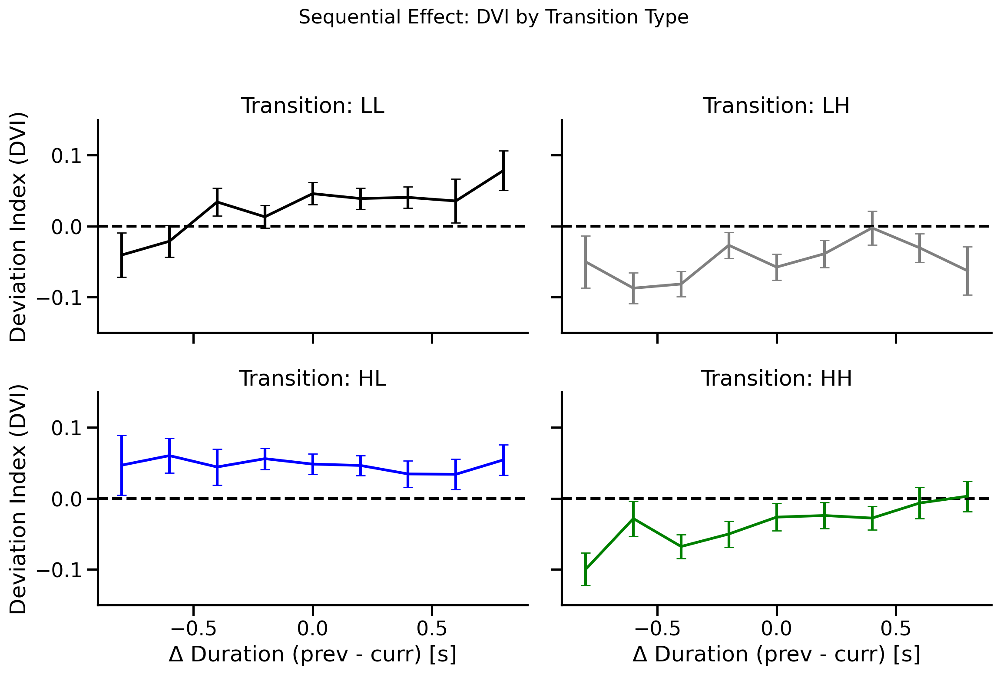

In [285]:
plot_dvi_curve(df, by_transition=True)

## 9 psychometric Analysis

###  Psychometric  Analysis (For Exploratory Interest Only)

Although PSE (Point of Subjective Equality) is a widely used concept in psychophysics, but it does **not strictly fit our task**.

Our experiment is based on a  **time reproduction task** using 5 points, not a two-alternative forced choice (2AFC) or binary judgment design. Participants were asked to reproduce durations rather than categorize them, meaning that psychometric function (e.g., sigmoid fit) can not capture our task.


### 9.1 Curves

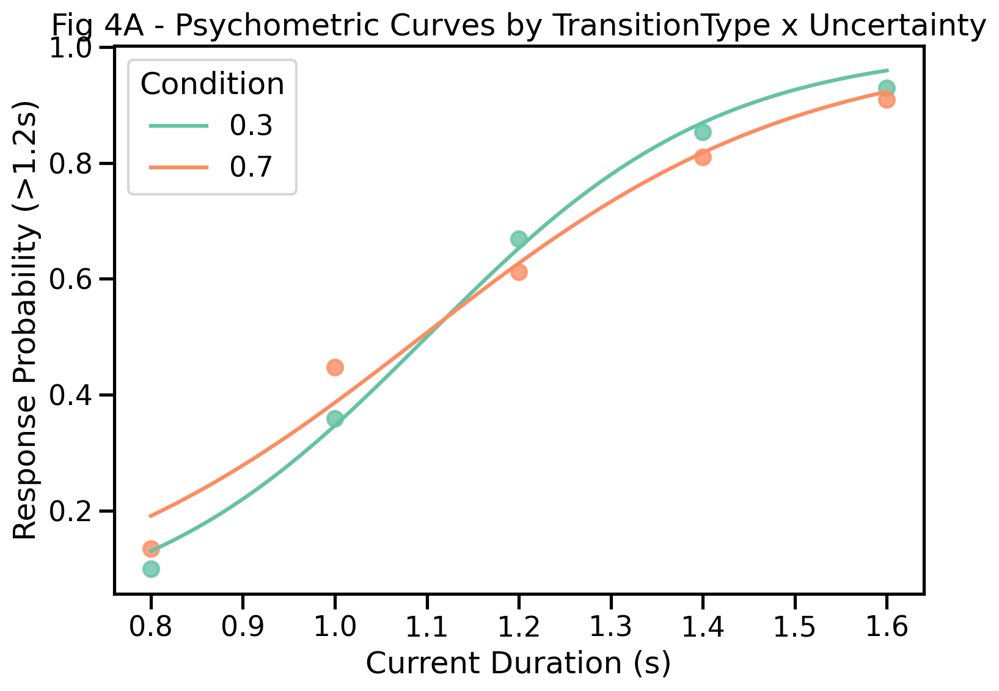

In [286]:

df['long_response'] = (df['rpr'] > 1.2).astype(int)
df['condition'] = df['preCoherence1back'] 
unique_conds = df['condition'].unique()
palette = sns.color_palette("Set2", n_colors=len(unique_conds))
color_map = dict(zip(unique_conds, palette))
# psychometric curve 
def sigmoid(x, a, b):
    return 1 / (1 + np.exp(-(x - a) / b))

plt.figure(figsize=(8, 6))

for cond, group in df.groupby('condition'):
    data = group.groupby('curDur')['long_response'].agg(['mean']).reset_index()
    x = data['curDur']
    y = data['mean']

    try:
        popt, _ = curve_fit(sigmoid, x, y, bounds=([0, 0.01], [2, 1]))
        x_fit = np.linspace(x.min(), x.max(), 100)
        y_fit = sigmoid(x_fit, *popt)
        plt.plot(x_fit, y_fit, label=cond, color=color_map[cond])
        plt.scatter(x, y, color=color_map[cond], alpha=0.8)
    except:
        print(f"Fit failed for {cond}")

plt.xlabel("Current Duration (s)")
plt.ylabel("Response Probability (>1.2s)")
plt.title("Fig 4A - Psychometric Curves by TransitionType x Uncertainty")
plt.legend(title="Condition")
plt.tight_layout()
plt.show()


C:\Users\10993\AppData\Local\Temp\ipykernel_55840\3332923516.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for cond, group in df.groupby('condition'):


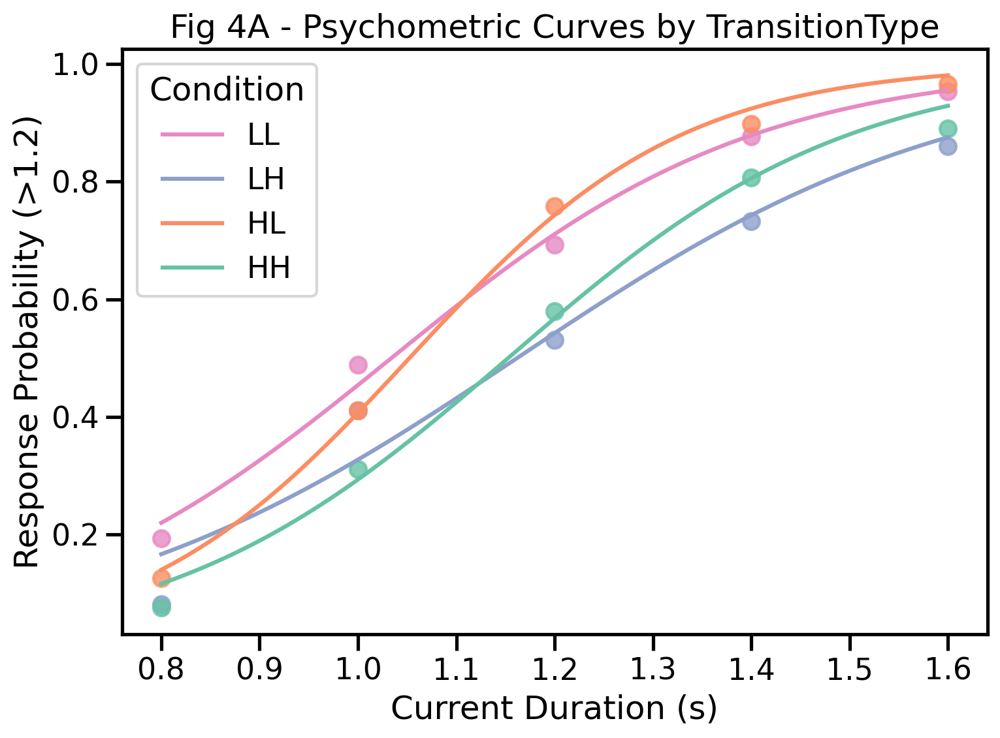

In [287]:
df['mean_rpr'] = df.groupby('subID')['rpr'].transform('mean')
df['long_response'] = (df['rpr'] > 1.2).astype(int)
df['condition'] = df['TransitionType']
unique_conds = df['condition'].unique()
palette = sns.color_palette("Set2", n_colors=len(unique_conds))
color_map = dict(zip(unique_conds, palette))
def sigmoid(x, a, b):
    return 1 / (1 + np.exp(-(x - a) / b))
plt.figure(figsize=(8, 6))

for cond, group in df.groupby('condition'):
    data = group.groupby('curDur')['long_response'].mean().reset_index()
    x = data['curDur']
    y = data['long_response']

    try:
        popt, _ = curve_fit(sigmoid, x, y, bounds=([0, 0.01], [2, 1]))
        x_fit = np.linspace(x.min(), x.max(), 100)
        y_fit = sigmoid(x_fit, *popt)
        plt.plot(x_fit, y_fit, label=cond, color=color_map[cond])
        plt.scatter(x, y, color=color_map[cond], alpha=0.8)
    except:
        print(f"Fit failed for {cond}")

plt.xlabel("Current Duration (s)")
plt.ylabel("Response Probability (>1.2)")
plt.title("Fig 4A - Psychometric Curves by TransitionType")
plt.legend(title="Condition")
plt.tight_layout()
plt.show()


### 9.2 Point of Subjective Equality

C:\Users\10993\AppData\Local\Temp\ipykernel_55840\2090975787.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for cond, group in df.groupby('condition'):
C:\Users\10993\AppData\Local\Temp\ipykernel_55840\2090975787.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_pse, x='TransitionType', y='PSE', palette='Set2')


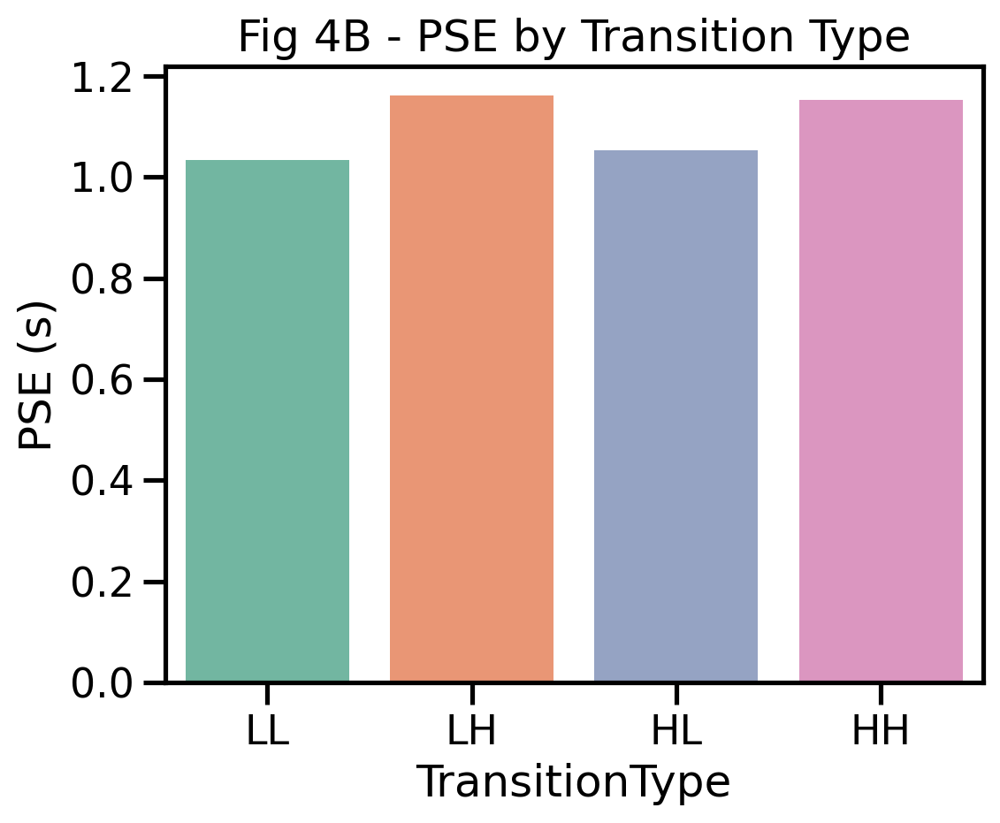

In [288]:
pse_data = []

for cond, group in df.groupby('condition'):
    data = group.groupby('curDur')['long_response'].agg(['mean']).reset_index()
    x = data['curDur']
    y = data['mean']

    try:
        popt, _ = curve_fit(sigmoid, x, y, bounds=([0, 0.01], [2, 1]))
        pse = popt[0]
        pse_data.append({'condition': cond, 'PSE': pse})
    except:
        continue

df_pse = pd.DataFrame(pse_data)

df_pse['condition'] = df_pse['condition'].astype(str)
df_pse['TransitionType'] = df_pse['condition'].str.split(' / ').str[0]


plt.figure(figsize=(6, 5))
sns.barplot(data=df_pse, x='TransitionType', y='PSE', palette='Set2')

plt.ylabel("PSE (s)")
plt.title("Fig 4B - PSE by Transition Type")
plt.tight_layout()
plt.show()


### 9.3 Fig 4C - Psychometric Curve by Prior Response

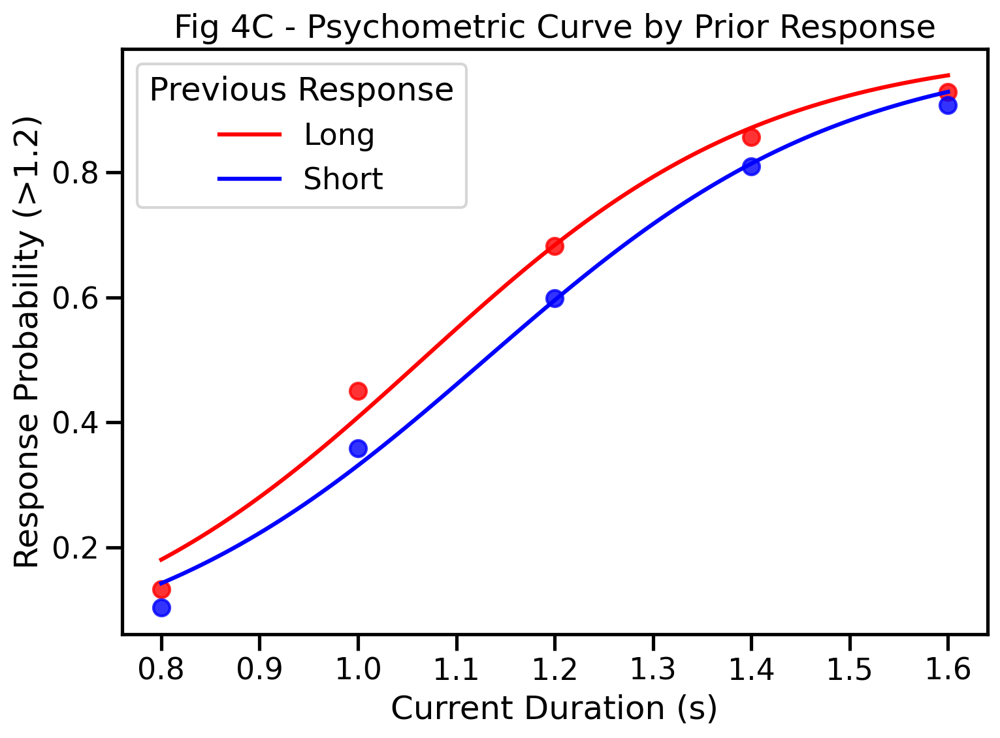

In [289]:
# step 1 calculate mean rpr
df['mean_rpr'] = df.groupby('subID')['rpr'].transform('mean')

# 2 long/short 
df['curResp'] = np.where(df['rpr'] > df['mean_rpr'], 'Long', 'Short')

# 3 get 1 back resp
df = df.sort_values(by=['subID', 'trial_num'])
df['preResp1back'] = df.groupby('subID')['curResp'].shift(1)

df_carry = df.dropna(subset=['preResp1back']).copy()

df_carry['long_response'] = (df_carry['rpr'] > 1.2).astype(int)
def sigmoid(x, a, b):
    return 1 / (1 + np.exp(-(x - a) / b))

plt.figure(figsize=(8, 6))
colors = {'Long': 'red', 'Short': 'blue'}

for resp_type, group in df_carry.groupby('preResp1back'):
    data = group.groupby('curDur')['long_response'].mean().reset_index()
    x = data['curDur']
    y = data['long_response']
    
    try:
        popt, _ = curve_fit(sigmoid, x, y, bounds=([0, 0.01], [2, 1]))
        x_fit = np.linspace(x.min(), x.max(), 100)
        y_fit = sigmoid(x_fit, *popt)
        plt.plot(x_fit, y_fit, label=resp_type, color=colors[resp_type])
        plt.scatter(x, y, color=colors[resp_type], alpha=0.8)
    except:
        print(f"Fit failed for {resp_type}")

plt.xlabel("Current Duration (s)")
plt.ylabel("Response Probability (>1.2)")
plt.title("Fig 4C - Psychometric Curve by Prior Response")
plt.legend(title="Previous Response")
plt.tight_layout()
plt.show()



### 9.4 Fig 4D - PSE LONG/SHORT

C:\Users\10993\AppData\Local\Temp\ipykernel_55840\2996986457.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_pse_carry, x='preResp1back', y='PSE', palette=colors)


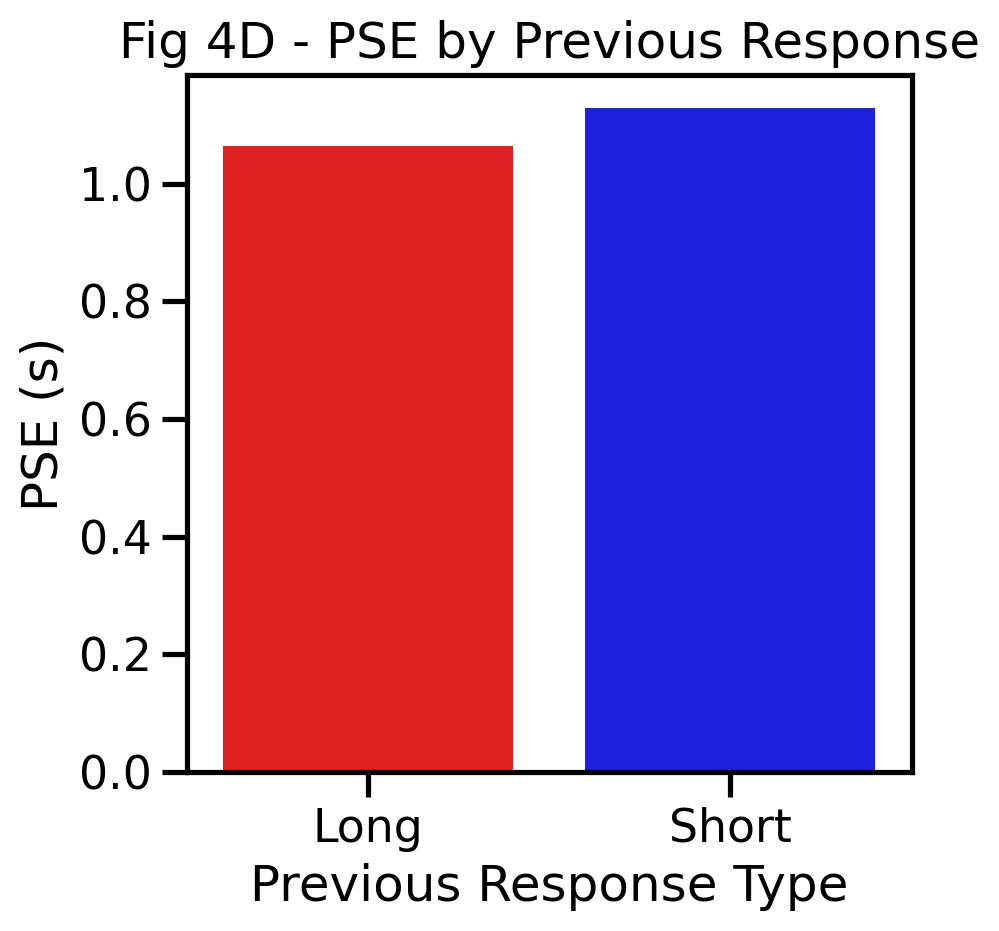

In [290]:
pse_data = []

for resp_type, group in df_carry.groupby('preResp1back'):
    data = group.groupby('curDur')['long_response'].mean().reset_index()
    x = data['curDur']
    y = data['long_response']
    try:
        popt, _ = curve_fit(sigmoid, x, y, bounds=([0, 0.01], [2, 1]))
        pse = popt[0]
        pse_data.append({'preResp1back': resp_type, 'PSE': pse})
    except:
        continue

df_pse_carry = pd.DataFrame(pse_data)


plt.figure(figsize=(5, 5))
sns.barplot(data=df_pse_carry, x='preResp1back', y='PSE', palette=colors)
plt.title("Fig 4D - PSE by Previous Response")
plt.ylabel("PSE (s)")
plt.xlabel("Previous Response Type")
plt.tight_layout()
plt.show()


### 9.5 Fig 5A 

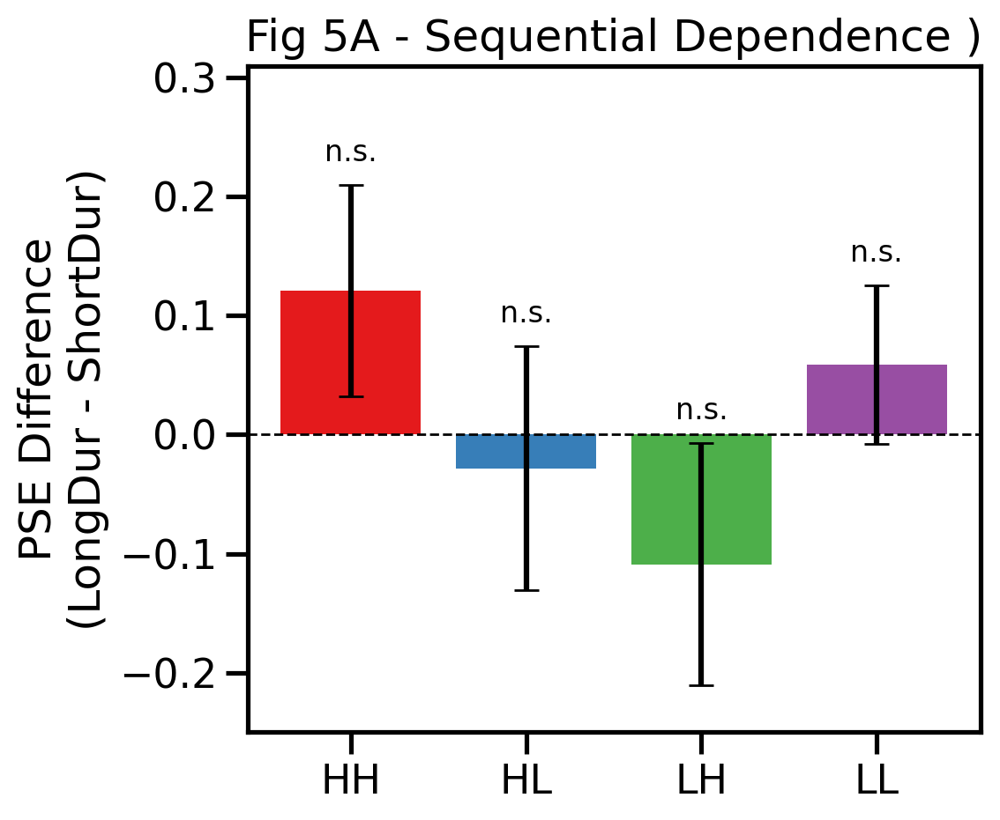

In [306]:
# PSE difference: Short - Long
df_seq_wide = df_pse_seq.pivot(index=['subID', 'TransitionType'], columns='preDurType', values='PSE').dropna()
df_seq_wide['diff'] = df_seq_wide['Long'] - df_seq_wide['Short']
df_seq_wide = df_seq_wide.reset_index()

# Plot
plt.figure(figsize=(6, 5))
types = df_seq_wide['TransitionType'].unique()
means, sems, pvals = [], [], []

for trans_type in types:
    diffs = df_seq_wide[df_seq_wide['TransitionType'] == trans_type]['diff']
    means.append(diffs.mean())
    sems.append(diffs.sem())
    _, pval = ttest_1samp(diffs, 0)
    pvals.append(pval)

x = np.arange(len(types))
plt.bar(x, means, yerr=sems, capsize=5, color=sns.color_palette("Set1", len(types)))
for i, pval in enumerate(pvals):
    label = "*" if pval < 0.05 else "n.s."
    y = means[i] + sems[i] + 0.02
    plt.text(i, y, label, ha='center', fontsize=12)
plt.axhline(0, color='black', linestyle='--', linewidth=1)

plt.xticks(x, types)
plt.ylabel("PSE Difference\n(LongDur - ShortDur)")
plt.title("Fig 5A - Sequential Dependence )")
plt.ylim(-0.25, max(np.array(means) + np.array(sems)) + 0.1)
plt.tight_layout()
plt.show()